# **📃Business Case: 🟩Yulu🚴 - Hypothesis Testing🧪**   

<img src="https://www.yulu.bike/wp-content/uploads/2023/09/WhatsApp-Image-2023-09-25-at-11.29.39.jpg">

# **About Yulu⚡**

Yulu is **India’s leading micro-mobility service provider**, which offers unique vehicles for the daily commute. Starting off as **a mission to eliminate traffic congestion in India🚦** , Yulu provides the safest commute solution through a user-friendly mobile app📱 to enable shared, solo and sustainable commuting.

**Yulu zones** are located at all the appropriate locations (including metro stations, bus stands, office spaces, residential areas, corporate offices, etc) **to make those first and last miles smooth, affordable, and convenient**😀


# **Problem Statement👀**
* **Yulu has recently suffered considerable dips in its revenues😟📉**. They have contracted a consulting company to understand the factors on which the demand for these shared electric cycles depends.

* Specifically, they want to understand **the factors affecting the demand for these shared electric cycles in the Indian market**💡

# **Objective🎯**

The company wants to know:

*  Which variables are significant in **predicting the demand** for shared electric cycles in the Indian market❓
* How well those variables describe the **electric cycle demands**

# **Getting help from Libraries📚**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# **Loading the data....⏯**

In [2]:
df = pd.read_csv('bike_sharing.csv')

# **Exploring the data...🔎**

In [3]:
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


In [4]:
df.tail()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
10881,2012-12-19 19:00:00,4,0,1,1,15.58,19.695,50,26.0027,7,329,336
10882,2012-12-19 20:00:00,4,0,1,1,14.76,17.425,57,15.0013,10,231,241
10883,2012-12-19 21:00:00,4,0,1,1,13.94,15.910,61,15.0013,4,164,168
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129
10885,2012-12-19 23:00:00,4,0,1,1,13.12,16.665,66,8.9981,4,84,88


In [5]:
df.shape

(10886, 12)

**🔍OBSERVATION🔎**

This data set has **10,886 Rows and 12 Columns.**

* **datetime:** datetime
* **season:** season (1: **spring**, 2: **summer**, 3: **fall**, 4: **winter**)
* **holiday:** whether day is a holiday or not
* **workingday:** if day is neither weekend nor holiday is 1, otherwise is 0.
* **weather:**

  * 1: Clear, Few clouds, partly cloudy, partly cloudy

  *  2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist

  * 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain +     Scattered clouds

  * 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

* **temp:** temperature in Celsius
* **atemp:** feeling temperature in Celsius
* **humidity:** humidity
* **windspeed:** wind speed
* **casual:** count of casual users
* **registered:** count of registered users
* **count:** count of total rental bikes including both casual and registered


In [6]:
# Number of unique values in each columns:
print("Number of unique values in each columns:")
print("-" * 40)
for elem in df.columns:
  print(f"{elem}: {df[elem].nunique()}")

Number of unique values in each columns:
----------------------------------------
datetime: 10886
season: 4
holiday: 2
workingday: 2
weather: 4
temp: 49
atemp: 60
humidity: 89
windspeed: 28
casual: 309
registered: 731
count: 822


In [7]:
# The unique values in the following columns:
print("The unique values in the following columns:")
print("-" * 43)
req_cols = ['season', 'holiday', 'workingday', 'weather']
for elem in req_cols:
  print(f"{elem}: {df[elem].unique()}")

The unique values in the following columns:
-------------------------------------------
season: [1 2 3 4]
holiday: [0 1]
workingday: [0 1]
weather: [1 2 3 4]


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


**🔍OBSERVATION🔎**

Changes needed for the following columns:
* datetime - From **object to datatime.**
* season, holiday, workingday & weather - From **int64 to category.**

**Changing the datatype and creating required columns🔄**

In [3]:
# Changing to datetime formate:
df["datetime"] = pd.to_datetime(df["datetime"])

In [4]:
# Creating the required columns:
df["date"] = pd.to_datetime(df["datetime"].dt.date)
df["year"] = df["datetime"].dt.year
df["month_no"] = df["datetime"].dt.month
df["month_name"] = df["datetime"].dt.month.replace({1: "Jan", 2: "Feb", 3: "Mar", 4: "Apr", 5: "May", 6: "Jun", 7: "Jul", 8: "Aug", 9: "Sep", 10: "Oct", 11: "Nov", 12: "Dec"})
df["day_name"] = df['datetime'].dt.day_name()
df["hour"] = df["datetime"].dt.hour

In [5]:
# Replacing the elements with rright meaning:
df["season"] = df["season"].replace({1: "spring", 2: "summer", 3: "fall", 4: "winter"})
df["weather"] = df["weather"].replace({1: "Clear", 2: "Mist & Cloudy", 3: "Light Snow", 4: "Heavy Rain"})
df["holiday"] = df["holiday"].replace({0: "No", 1: "Yes"})
df["workingday"] = df["workingday"].replace({0: "No", 1: "Yes"})

In [6]:
# Replacing the column name:
df.rename(columns={"count": "total_users"}, inplace = True)

In [7]:
# Changing the datatype of the following columns:
req_list = ['season', 'holiday', 'workingday', 'weather','month_name', 'day_name']
for elem in req_list:
  df[elem] = df[elem].astype("category")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   datetime     10886 non-null  datetime64[ns]
 1   season       10886 non-null  category      
 2   holiday      10886 non-null  category      
 3   workingday   10886 non-null  category      
 4   weather      10886 non-null  category      
 5   temp         10886 non-null  float64       
 6   atemp        10886 non-null  float64       
 7   humidity     10886 non-null  int64         
 8   windspeed    10886 non-null  float64       
 9   casual       10886 non-null  int64         
 10  registered   10886 non-null  int64         
 11  total_users  10886 non-null  int64         
 12  date         10886 non-null  datetime64[ns]
 13  year         10886 non-null  int64         
 14  month_no     10886 non-null  int64         
 15  month_name   10886 non-null  category      
 16  day_

In [8]:
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_users,date,year,month_no,month_name,day_name,hour
0,2011-01-01 00:00:00,spring,No,No,Clear,9.84,14.395,81,0.0,3,13,16,2011-01-01,2011,1,Jan,Saturday,0
1,2011-01-01 01:00:00,spring,No,No,Clear,9.02,13.635,80,0.0,8,32,40,2011-01-01,2011,1,Jan,Saturday,1
2,2011-01-01 02:00:00,spring,No,No,Clear,9.02,13.635,80,0.0,5,27,32,2011-01-01,2011,1,Jan,Saturday,2
3,2011-01-01 03:00:00,spring,No,No,Clear,9.84,14.395,75,0.0,3,10,13,2011-01-01,2011,1,Jan,Saturday,3
4,2011-01-01 04:00:00,spring,No,No,Clear,9.84,14.395,75,0.0,0,1,1,2011-01-01,2011,1,Jan,Saturday,4


# **Checking the missing values and Nulls🔎**

In [15]:
# Checking for nulls:
df.isna().sum()

datetime       0
season         0
holiday        0
workingday     0
weather        0
temp           0
atemp          0
humidity       0
windspeed      0
casual         0
registered     0
total_users    0
date           0
year           0
month_no       0
month_name     0
day_name       0
hour           0
dtype: int64

In [16]:
# Checking for duplicates:
df.duplicated().sum()

0

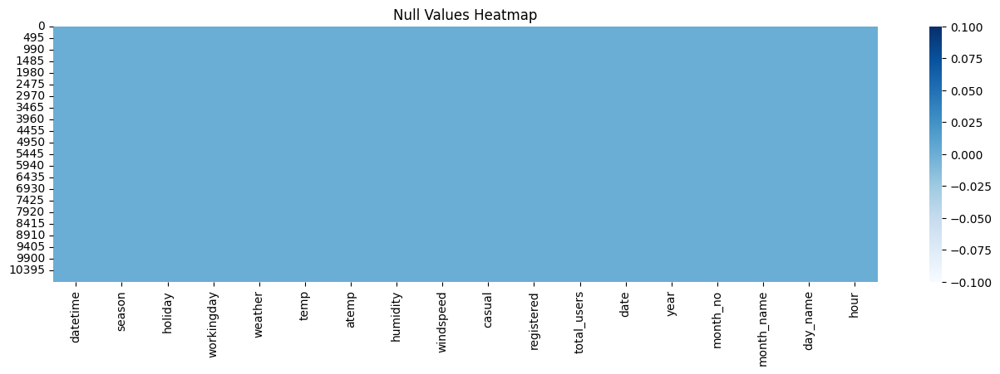

In [17]:
# Null value heatmap:
plt.figure(figsize = (16,4))
sns.heatmap(df.isnull(), cmap='Blues')
plt.title('Null Values Heatmap')
plt.show()

**🔍OBSERVATION🔎**

There are **no duplicates and null values** in the dataset.

# **Descriptive statistics📃**

In [18]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
datetime,10886,2011-12-27 05:56:22.399411968,2011-01-01 00:00:00,2011-07-02 07:15:00,2012-01-01 20:30:00,2012-07-01 12:45:00,2012-12-19 23:00:00,NaN
temp,10886.0,20.23086,0.82,13.94,20.5,26.24,41.0,7.79159
atemp,10886.0,23.655084,0.76,16.665,24.24,31.06,45.455,8.474601
humidity,10886.0,61.88646,0.0,47.0,62.0,77.0,100.0,19.245033
windspeed,10886.0,12.799395,0.0,7.0015,12.998,16.9979,56.9969,8.164537
casual,10886.0,36.021955,0.0,4.0,17.0,49.0,367.0,49.960477
registered,10886.0,155.552177,0.0,36.0,118.0,222.0,886.0,151.039033
total_users,10886.0,191.574132,1.0,42.0,145.0,284.0,977.0,181.144454
date,10886,2011-12-26 18:23:52.592320256,2011-01-01 00:00:00,2011-07-02 00:00:00,2012-01-01 00:00:00,2012-07-01 00:00:00,2012-12-19 00:00:00,NaN
year,10886.0,2011.501929,2011.0,2011.0,2012.0,2012.0,2012.0,0.500019


In [19]:
df.describe(include = "category").T

,count,unique,top,freq
season,10886,4,winter,2734
holiday,10886,2,No,10575
workingday,10886,2,Yes,7412
weather,10886,4,Clear,7192
month_name,10886,12,Aug,912
day_name,10886,7,Saturday,1584


**🔍OBSERVATION🔎**

* The **mean total_use**r is **191** and **median is 145**.
* In **winter season** has highest contribution.
* The **Working day** has the highest contribution.
* The **Clear weather** has the highest contribution.
* The **month August** has the highest contribution.

# **Exploratory Data Analysis 📊📈**

## **Non Graphical Analysis📑**

In [20]:
# Min Date:
df['datetime'].min()

Timestamp('2011-01-01 00:00:00')

In [21]:
# Max Date:
df['datetime'].max()

Timestamp('2012-12-19 23:00:00')

In [22]:
# Total number of days:
df['datetime'].max() - df['datetime'].min()

Timedelta('718 days 23:00:00')

In [23]:
# Value Count for all columns:
for elem in df.columns:
  print(f"Column Name: {elem}")
  print(df[elem].value_counts())
  print("_" * 50)
  print()

Column Name: datetime
datetime
2011-01-01 00:00:00    1
2012-05-01 21:00:00    1
2012-05-01 13:00:00    1
2012-05-01 14:00:00    1
2012-05-01 15:00:00    1
                      ..
2011-09-02 04:00:00    1
2011-09-02 05:00:00    1
2011-09-02 06:00:00    1
2011-09-02 07:00:00    1
2012-12-19 23:00:00    1
Name: count, Length: 10886, dtype: int64
__________________________________________________

Column Name: season
season
winter    2734
fall      2733
summer    2733
spring    2686
Name: count, dtype: int64
__________________________________________________

Column Name: holiday
holiday
No     10575
Yes      311
Name: count, dtype: int64
__________________________________________________

Column Name: workingday
workingday
Yes    7412
No     3474
Name: count, dtype: int64
__________________________________________________

Column Name: weather
weather
Clear            7192
Mist & Cloudy    2834
Light Snow        859
Heavy Rain          1
Name: count, dtype: int64
_______________________

**🔍OBSERVATION🔎**

We have data of around **718 day**s that is almost two years. Starting from **2011-01-01** and ending till **2012-12-19**

## **Univeriate Analysis📊**

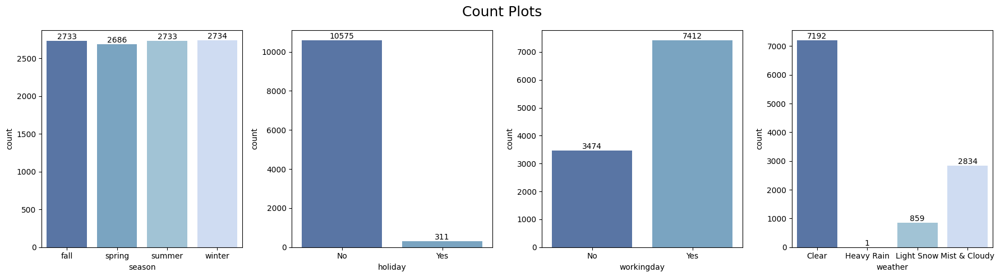

In [24]:
columns = ['season', 'holiday', 'workingday', 'weather']
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.figure(figsize=(18,5))
for i, elem in enumerate(columns):
  plt.subplot(1,len(columns),i+1)
  label = sns.countplot(data = df, x = elem, palette = shades_of_blue)
  for i in label.containers:
    label.bar_label(i)
plt.suptitle("Count Plots", fontsize = 18)
plt.tight_layout()
plt.show()

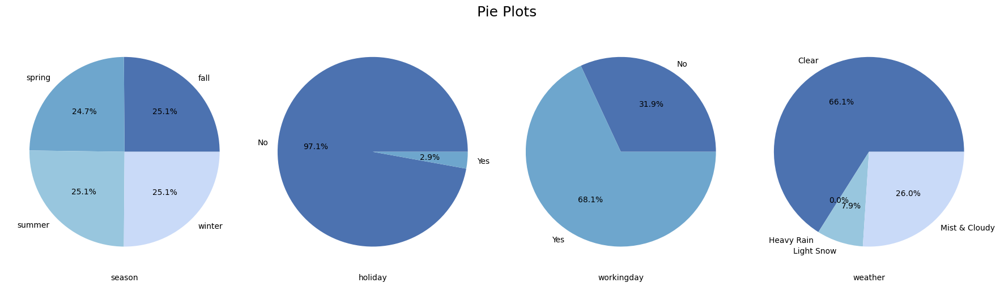

In [25]:
columns = ['season', 'holiday', 'workingday', 'weather']
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.figure(figsize=(18,5))
for i, elem in enumerate(columns):
  plt.subplot(1,len(columns),i+1)
  labels = df.groupby(elem)[elem].count().index.categories
  plt.pie(df.groupby(elem)[elem].count().values, labels = labels, autopct = "%1.1f%%", colors=shades_of_blue)
  plt.xlabel(elem)
plt.suptitle("Pie Plots", fontsize = 18)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

* Sesaon: **Almost all seasons** has the same contributions.
* **Working day** has the highest contribution.
* The **Clear weather** has the highest contribution.

In [26]:
# Preparing Numerical dataframe:
df_numerical = df.iloc[:,5:12]

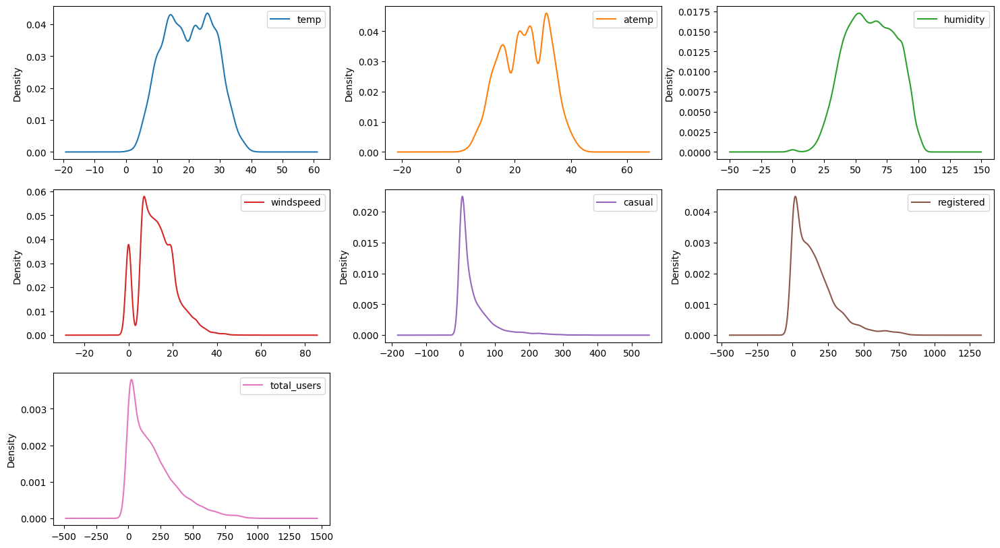

In [27]:
# Distribution of Numerical variable:
plt.rcParams["figure.figsize"] = [18,10]
df_numerical.plot(kind="density", subplots = True, layout = (3,3), sharex = False)
plt.show()

In [28]:
# Skewness Coefficient:
df_numerical.skew().round(4)

temp           0.0037
atemp         -0.1026
humidity      -0.0863
windspeed      0.5888
casual         2.4957
registered     1.5248
total_users    1.2421
dtype: float64

In [29]:
# kurtosis co-efficient:
df_numerical.kurt().round(4)

temp          -0.9145
atemp         -0.8501
humidity      -0.7598
windspeed      0.6301
casual         7.5516
registered     2.6261
total_users    1.3001
dtype: float64

**🔍OBSERVATION🔎**
* The **distribution of temp, atemp and humidity is close to normal** distribution,
* All the other columns are mostly **right skewed** distribution and **has good amount of outliers.**

## **Bivariate Analysis📊**

In [11]:
# Average users for each month:
df.groupby(['year','month_no'])['total_users'].mean().to_frame().style.background_gradient(cmap='Blues')

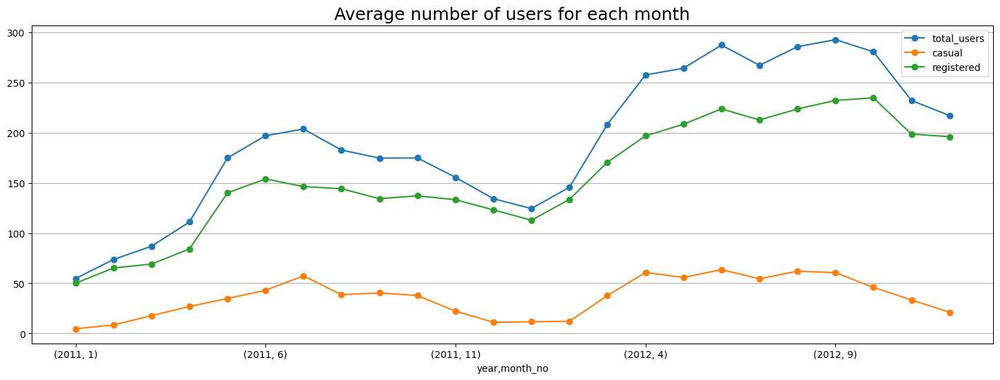

In [31]:
# Average number of users for each month:
plt.figure(figsize = (18,6))
df.groupby(['year','month_no'])['total_users'].mean().plot(kind = 'line', marker = 'o')
df.groupby(['year','month_no'])['casual'].mean().plot(kind = 'line', marker = 'o')
df.groupby(['year','month_no'])['registered'].mean().plot(kind = 'line', marker = 'o')
plt.grid(axis = 'y')
plt.title("Average number of users for each month", fontsize = 18)
plt.legend()
plt.show()

**🔍OBSERVATION🔎**

The **average number of registerd users are high** than the casual users.

* Regarding the average users or average rides there is a **uptrend over the years.**
* When compared to 2011, the year **2012 has highest average number of rides for each month.**
* The highest average number of rides happened in the **Sep 2012**.  

In [12]:
# Average users for each hour:
df.groupby(['hour'])['total_users'].mean().to_frame().style.background_gradient(cmap='Blues')

,total_users
hour,
0,55.138462
1,33.859031
2,22.899554
3,11.757506
4,6.407240
5,19.767699
6,76.259341
7,213.116484
8,362.769231


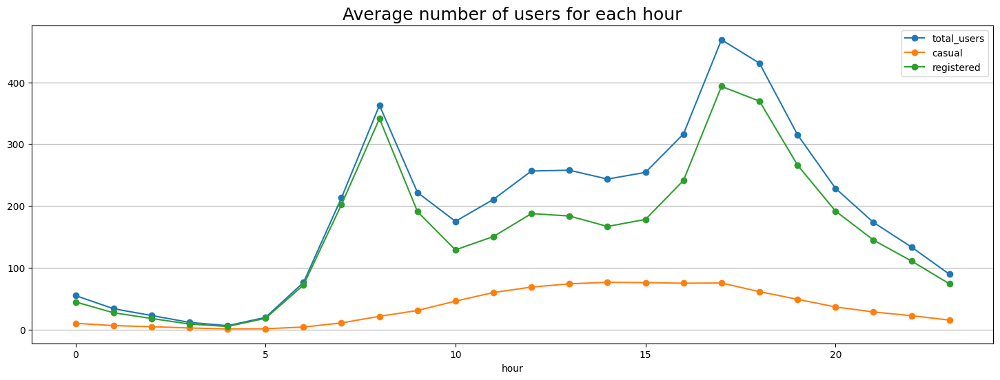

In [33]:
# Average number of users for each hour:
plt.figure(figsize = (18,6))
df.groupby(['hour'])['total_users'].mean().plot(kind = 'line', marker = 'o')
df.groupby(['hour'])['casual'].mean().plot(kind = 'line', marker = 'o')
df.groupby(['hour'])['registered'].mean().plot(kind = 'line', marker = 'o')
plt.grid(axis = 'y')
plt.title("Average number of users for each hour", fontsize = 18)
plt.legend()
plt.show()

In [34]:
# Average number of bikes needed in Morning hours:
morningbikes = df[(df["hour"] >= 7) & (df["hour"] <= 9)]["total_users"].mean().round()
print(f"Average number of bikes needed in Morning peak hours: {morningbikes}")

Average number of bikes needed in Morning peak hours: 266.0


In [35]:
# Average number of bikes needed in Evening hours:
morningbikes = df[(df["hour"] >= 16) & (df["hour"] <= 19)]["total_users"].mean().round()
print(f"Average number of bikes needed in Evening peak hours: {morningbikes}")

Average number of bikes needed in Evening peak hours: 383.0


In [36]:
# Average number of bikes needed from morning 7 am to Evening 7 pm
activehourbikes = df[(df["hour"] >= 7) & (df["hour"] <= 19)]["total_users"].mean().round()
print(f"Average number of bikes needed from morning 7 am to Evening 7 pm: {activehourbikes}")

Average number of bikes needed from morning 7 am to Evening 7 pm: 287.0


In [37]:
# Average number of bikes needed for non active hours:
nonactivehourbikes = df[~((df["hour"] >= 7) & (df["hour"] <= 19))]["total_users"].mean().round()
print(f"Average number of bikes needed for non active hours: {nonactivehourbikes}")

Average number of bikes needed for non active hours: 78.0


**🔍OBSERVATION🔎**

The **average number of registerd users are high** than the casual users.

* **Morning 8 am** and **Evening 5 pm** has the **highest average number of bookings.**
* From the above table we can say that there is **highest demand for bike rides are from Morning 7 am to 9 am and Evening 4 pm to 7 pm.**

* Average number of bikes needed in **Morning peak hours: 266**
* Average number of bikes needed in **Evening peak hours: 383**
* Average number of bikes needed from **morning 7 am to Evening 7 pm: 287**
* Average number of bikes needed for **non active hours: 78**

**🔍INFERENCE🔎**
* There is **highst demand for bike rides are in the Evening from 4 pm to 7 pm**

In [38]:
# Analysis of workingday Vs total_users:
df.groupby('workingday')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
workingday,,,,,,,,
No,3474.0,188.506621,173.724015,1.0,44.0,128.0,304.0,783.0
Yes,7412.0,193.011873,184.513659,1.0,41.0,151.0,277.0,977.0


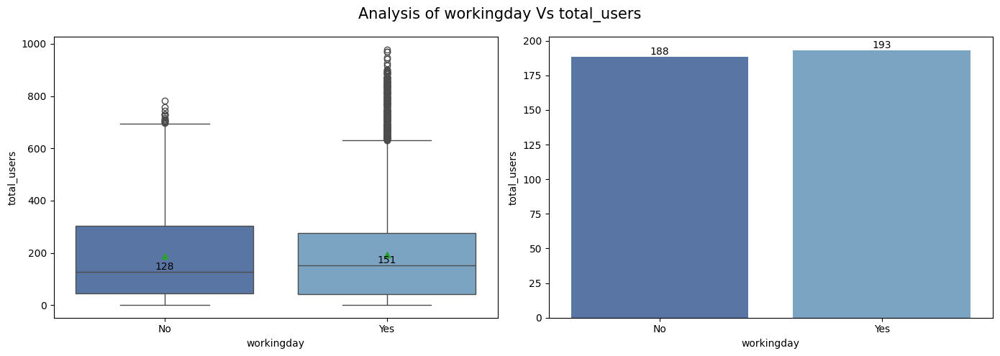

In [39]:
# Analysis of workingday Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df, x="workingday", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df.groupby('workingday')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('workingday')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df.groupby("workingday")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='workingday', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of workingday Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The number of bike rides in the **working day is high.**

Working day:
* **Mean is 193** and **Median is 151**

Non Working day:
* **Mean is 188** and **Median is 128**

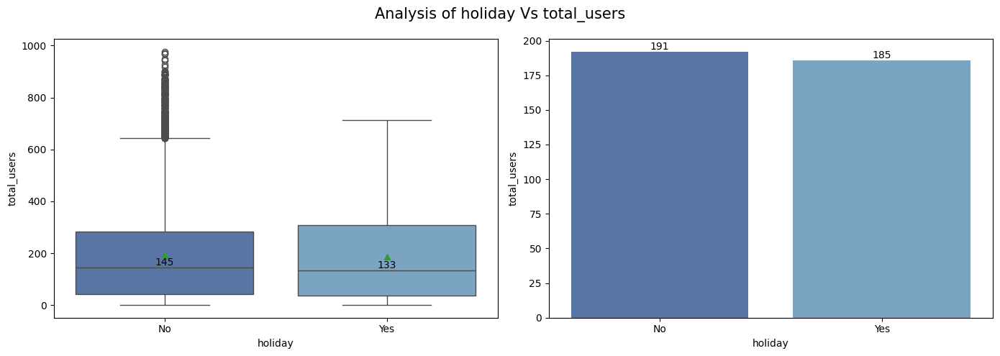

In [144]:
# Analysis of Holiday Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df, x="holiday", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df.groupby('holiday')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('holiday')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df.groupby("holiday")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='holiday', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of holiday Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The number of bike rides in the **nonholiday is high.**

Holiday:
* **Mean is 185** and **Median is 133**

Non-Holiday:
* **Mean is 191** and **Median is 145**

In [40]:
# Analysis of weather Vs total_users:
df.groupby('weather')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
weather,,,,,,,,
Clear,7192.0,205.236791,187.959566,1.0,48.0,161.0,305.0,977.0
Heavy Rain,1.0,164.000000,NaN,164.0,164.0,164.0,164.0,164.0
Light Snow,859.0,118.846333,138.581297,1.0,23.0,71.0,161.0,891.0
Mist & Cloudy,2834.0,178.955540,168.366413,1.0,41.0,134.0,264.0,890.0


In [41]:
# There is only one record for Heavy Rain:
df[df["weather"] == "Heavy Rain"]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_users,date,year,month_no,month_name,day_name,hour
5631,2012-01-09 18:00:00,spring,No,Yes,Heavy Rain,8.2,11.365,86,6.0032,6,158,164,2012-01-09,2012,1,Jan,Monday,18


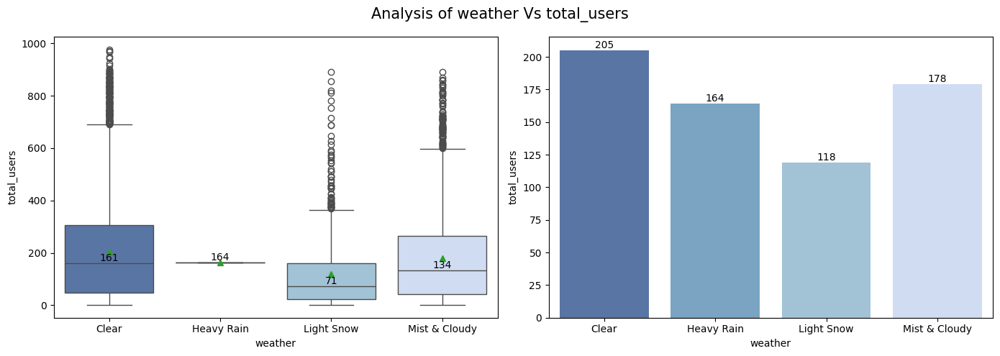

In [42]:
# Analysis of weather Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df, x="weather", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df.groupby('weather')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('weather')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df.groupby("weather")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='weather', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of weather Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The mean and median number of bike rides in the **Clear weather is high.** followed by Mist & Cloudy and Light Snow.






In [43]:
# Analysis of season Vs total_users:
df.groupby('season')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
fall,2733.0,234.417124,197.151001,1.0,68.0,195.0,347.0,977.0
spring,2686.0,116.343261,125.273974,1.0,24.0,78.0,164.0,801.0
summer,2733.0,215.251372,192.007843,1.0,49.0,172.0,321.0,873.0
winter,2734.0,198.988296,177.622409,1.0,51.0,161.0,294.0,948.0


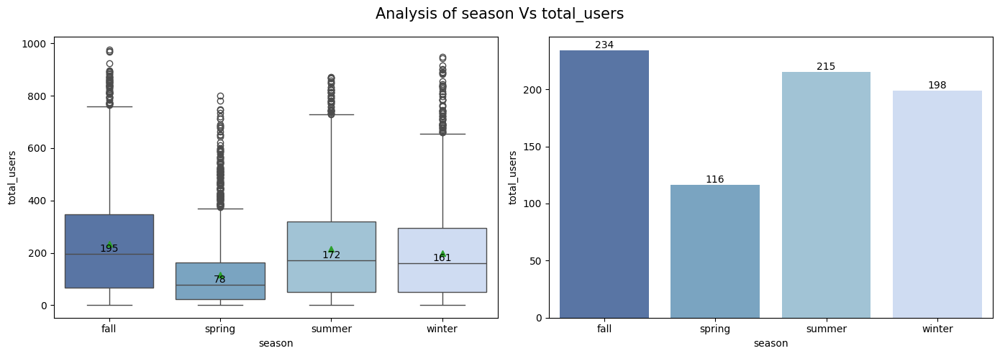

In [44]:
# Analysis of season Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df, x="season", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df.groupby('season')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('season')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df.groupby("season")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='season', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of season Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The mean and median number of bike rides in the **fall season is high** followed by summer, winter and Spring.


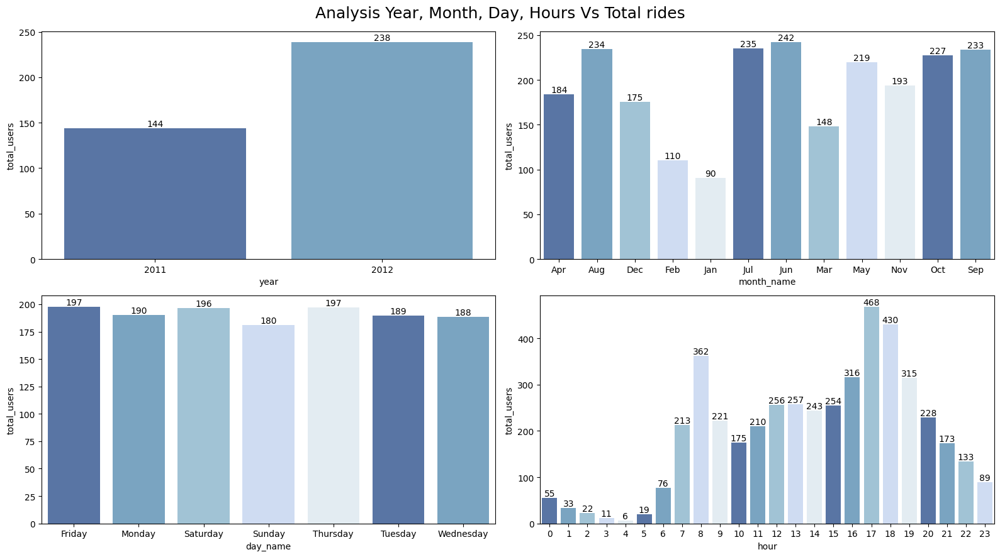

In [45]:
# Analysis Year, Month, Day, Hours Vs Total rides
columns = ['year', 'month_name', 'day_name', 'hour']
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.figure(figsize=(16,9))
for i, elem in enumerate(columns):
  plt.subplot(2,2,i+1)
  label = sns.barplot(data = df, x = elem, y = "total_users", palette = shades_of_blue, ci=None)
  for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')
plt.suptitle("Analysis Year, Month, Day, Hours Vs Total rides", fontsize = 18)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

* The average number of rides in **2012 is high** compared to 2011.
* The average number of rides in **June, July, August, September and October are high**.
* Almost all days has the average same number of bookings. **Friday and Thursday has the highest average number of rises.**
* Average number of bike rides are **high in Morning 7 am to 9 pm and Evening 4 pm to 7 pm.**
* The most active hours are from **morning 7 am to Evening 7 pm.**

## **Outliers Detection and Treatment:🕵**

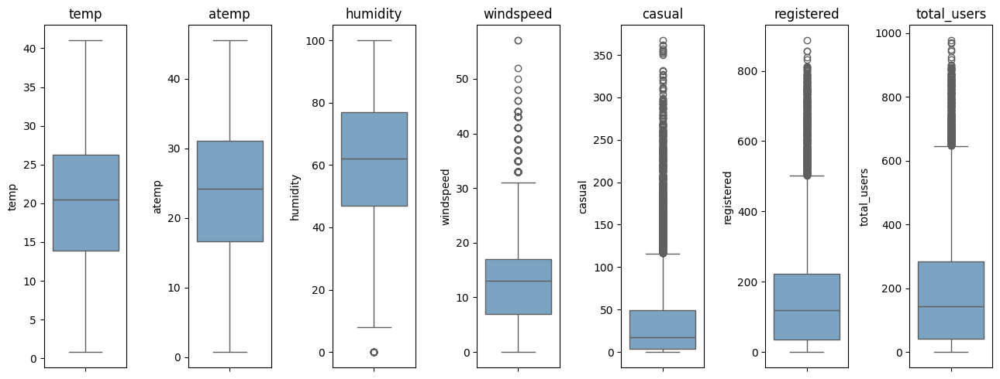

In [48]:
# Create box plots for each continuous variable
continuous_vars = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'total_users']
shades_of_blue = ['#6ea6cd']
plt.figure(figsize=(13, 5))
for i, col in enumerate(continuous_vars):
    plt.subplot(1, len(continuous_vars), i+1)
    sns.boxplot(df[col], palette = shades_of_blue)
    plt.title(col)
plt.tight_layout()
plt.show()

In [49]:
#Exploring the Box plot:
columns_to_check = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'total_users']

def detect_outliers(column):
  Q1 = np.percentile(df[column],25)
  median = np.percentile(df[column],50)
  Q3 = np.percentile(df[column],75)
  IQR = Q3 - Q1
  lower_bound = max(df[column].min(), Q1 - 1.5 * IQR)
  upper_bound = min(df[column].max(), Q3 + 1.5 * IQR)
  outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
  percentage_outliers = (len(outliers)/len(df)) * 100
  print(f"For columns: {col}")
  print(f"Lower bound value: {lower_bound.round(2)} \nQ1: {Q1.round(2)} \nMedian: {median.round(2)} \nQ3: {Q3.round(2)} \nUpper bound value: {upper_bound.round(2)} \nIQR: {IQR.round(2)}")
  return percentage_outliers

for col in columns_to_check:
    percentage = detect_outliers(col)
    print(f"Percentage of outliers in column '{col}': {percentage:.2f}%")
    print("-" * 60)

For columns: temp
Lower bound value: 0.82 
Q1: 13.94 
Median: 20.5 
Q3: 26.24 
Upper bound value: 41.0 
IQR: 12.3
Percentage of outliers in column 'temp': 0.00%
------------------------------------------------------------
For columns: atemp
Lower bound value: 0.76 
Q1: 16.66 
Median: 24.24 
Q3: 31.06 
Upper bound value: 45.46 
IQR: 14.4
Percentage of outliers in column 'atemp': 0.00%
------------------------------------------------------------
For columns: humidity
Lower bound value: 2.0 
Q1: 47.0 
Median: 62.0 
Q3: 77.0 
Upper bound value: 100 
IQR: 30.0
Percentage of outliers in column 'humidity': 0.20%
------------------------------------------------------------
For columns: windspeed
Lower bound value: 0.0 
Q1: 7.0 
Median: 13.0 
Q3: 17.0 
Upper bound value: 31.99 
IQR: 10.0
Percentage of outliers in column 'windspeed': 2.09%
------------------------------------------------------------
For columns: casual
Lower bound value: 0 
Q1: 4.0 
Median: 17.0 
Q3: 49.0 
Upper bound value: 116

**Outlier removal using IQR✅:**

In [50]:
# Calculating IQR:
Q1 = df_numerical.quantile(0.25)
Q3 = df_numerical.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

temp            12.3000
atemp           14.3950
humidity        30.0000
windspeed        9.9964
casual          45.0000
registered     186.0000
total_users    242.0000
dtype: float64


In [51]:
# Outliers filteration:
df_iqr = df[~((df_numerical < (Q1- 1.5*IQR))|(df_numerical > (Q3 + 1.5*IQR))).any(axis=1)]

In [52]:
len(df)

10886

In [53]:
len(df_iqr)

9518

In [54]:
len(df) - len(df_iqr)

1368

**🔍OBSERVATION🔎**

After IQR outlier removal treatment, **1368 rows has been removed** which is around **12.5%** of the original data.

In [55]:
df_iqr.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_users,date,year,month_no,month_name,day_name,hour
0,2011-01-01 00:00:00,spring,No,No,Clear,9.84,14.395,81,0.0,3,13,16,2011-01-01,2011,1,Jan,Saturday,0
1,2011-01-01 01:00:00,spring,No,No,Clear,9.02,13.635,80,0.0,8,32,40,2011-01-01,2011,1,Jan,Saturday,1
2,2011-01-01 02:00:00,spring,No,No,Clear,9.02,13.635,80,0.0,5,27,32,2011-01-01,2011,1,Jan,Saturday,2
3,2011-01-01 03:00:00,spring,No,No,Clear,9.84,14.395,75,0.0,3,10,13,2011-01-01,2011,1,Jan,Saturday,3
4,2011-01-01 04:00:00,spring,No,No,Clear,9.84,14.395,75,0.0,0,1,1,2011-01-01,2011,1,Jan,Saturday,4


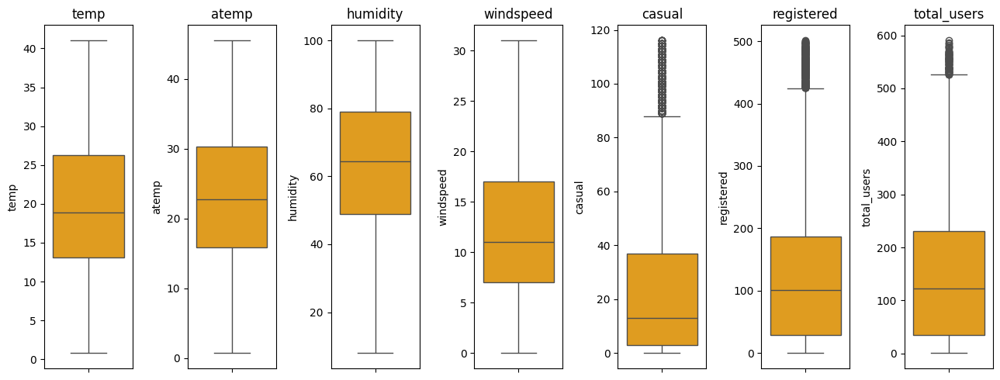

In [56]:
# Create box plots for each continuous variable
continuous_vars = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'total_users']
shades_of_blue = ['#6ea6cd']
plt.figure(figsize=(13, 5))
for i, col in enumerate(continuous_vars):
    plt.subplot(1, len(continuous_vars), i+1)
    sns.boxplot(df_iqr[col], color="orange")
    plt.title(col)
plt.tight_layout()
plt.show()

In [57]:
#Exploring the Box plot:
columns_to_check = ['temp', 'atemp','humidity', 'windspeed', 'casual', 'registered', 'total_users']

def detect_outliers(column):
  Q1 = np.percentile(df_iqr[column],25)
  median = np.percentile(df_iqr[column],50)
  Q3 = np.percentile(df_iqr[column],75)
  IQR = Q3 - Q1
  lower_bound = max(df_iqr[column].min(), Q1 - 1.5 * IQR)
  upper_bound = min(df_iqr[column].max(), Q3 + 1.5 * IQR)
  outliers = df_iqr[(df_iqr[column] < lower_bound) | (df_iqr[column] > upper_bound)]
  percentage_outliers = (len(outliers)/len(df_iqr)) * 100
  print(f"For columns: {col}")
  print(f"Lower bound value: {lower_bound.round(2)} \nQ1: {Q1.round(2)} \nMedian: {median.round(2)} \nQ3: {Q3.round(2)} \nUpper bound value: {upper_bound.round(2)} \nIQR: {IQR.round(2)}")
  return percentage_outliers

for col in columns_to_check:
    percentage = detect_outliers(col)
    print(f"Percentage of outliers in column '{col}': {percentage:.2f}%")
    print("-" * 60)

For columns: temp
Lower bound value: 0.82 
Q1: 13.12 
Median: 18.86 
Q3: 26.24 
Upper bound value: 41.0 
IQR: 13.12
Percentage of outliers in column 'temp': 0.00%
------------------------------------------------------------
For columns: atemp
Lower bound value: 0.76 
Q1: 15.91 
Median: 22.72 
Q3: 30.3 
Upper bound value: 45.46 
IQR: 14.4
Percentage of outliers in column 'atemp': 0.00%
------------------------------------------------------------
For columns: humidity
Lower bound value: 8 
Q1: 49.0 
Median: 64.5 
Q3: 79.0 
Upper bound value: 100 
IQR: 30.0
Percentage of outliers in column 'humidity': 0.00%
------------------------------------------------------------
For columns: windspeed
Lower bound value: 0.0 
Q1: 7.0 
Median: 11.0 
Q3: 17.0 
Upper bound value: 31.0 
IQR: 10.0
Percentage of outliers in column 'windspeed': 0.00%
------------------------------------------------------------
For columns: casual
Lower bound value: 0 
Q1: 3.0 
Median: 13.0 
Q3: 37.0 
Upper bound value: 88.0 

## **Correlation Analysis🤝**

In [58]:
# Creating Numeric dataframe:
numeric_df = df_iqr.select_dtypes(include=['number'])

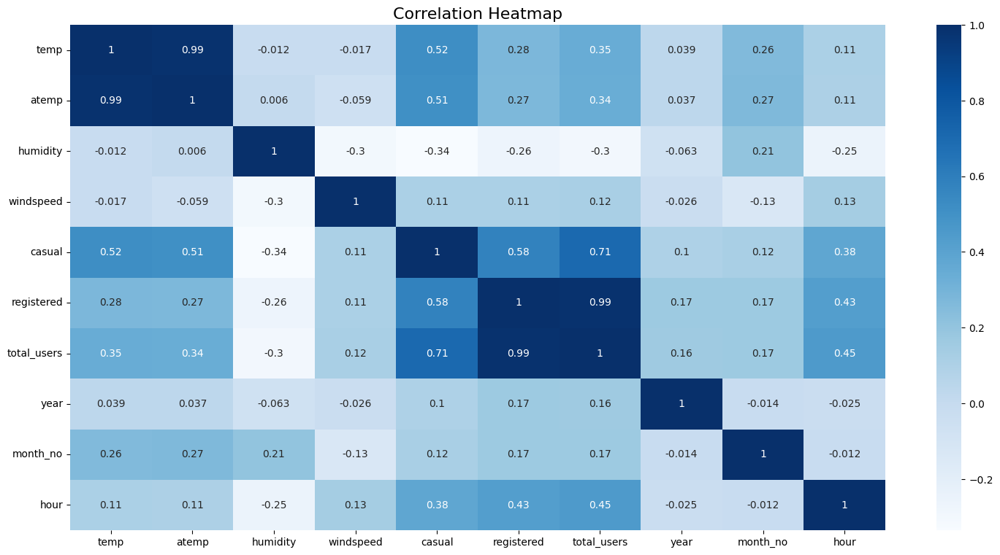

In [59]:
# Correlation score using heatmap:
plt.figure(figsize=(18, 9))
sns.heatmap(numeric_df.corr(),cmap="Blues", annot=True)
plt.title("Correlation Heatmap", fontsize=16)
plt.show()

<Figure size 1000x500 with 0 Axes>

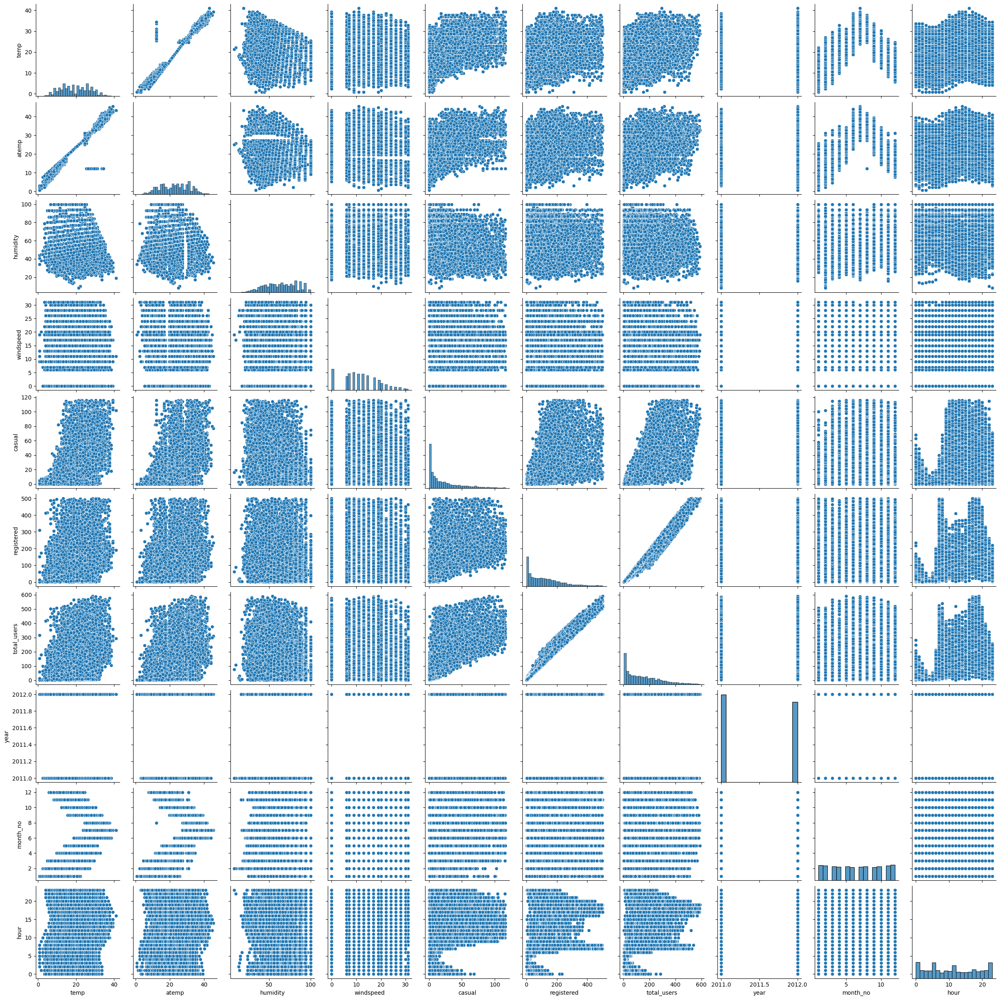

In [ ]:
# Pair Plot:
plt.figure(figsize=(10, 5))
sns.pairplot(data=numeric_df)
plt.show()

<Figure size 1000x500 with 0 Axes>

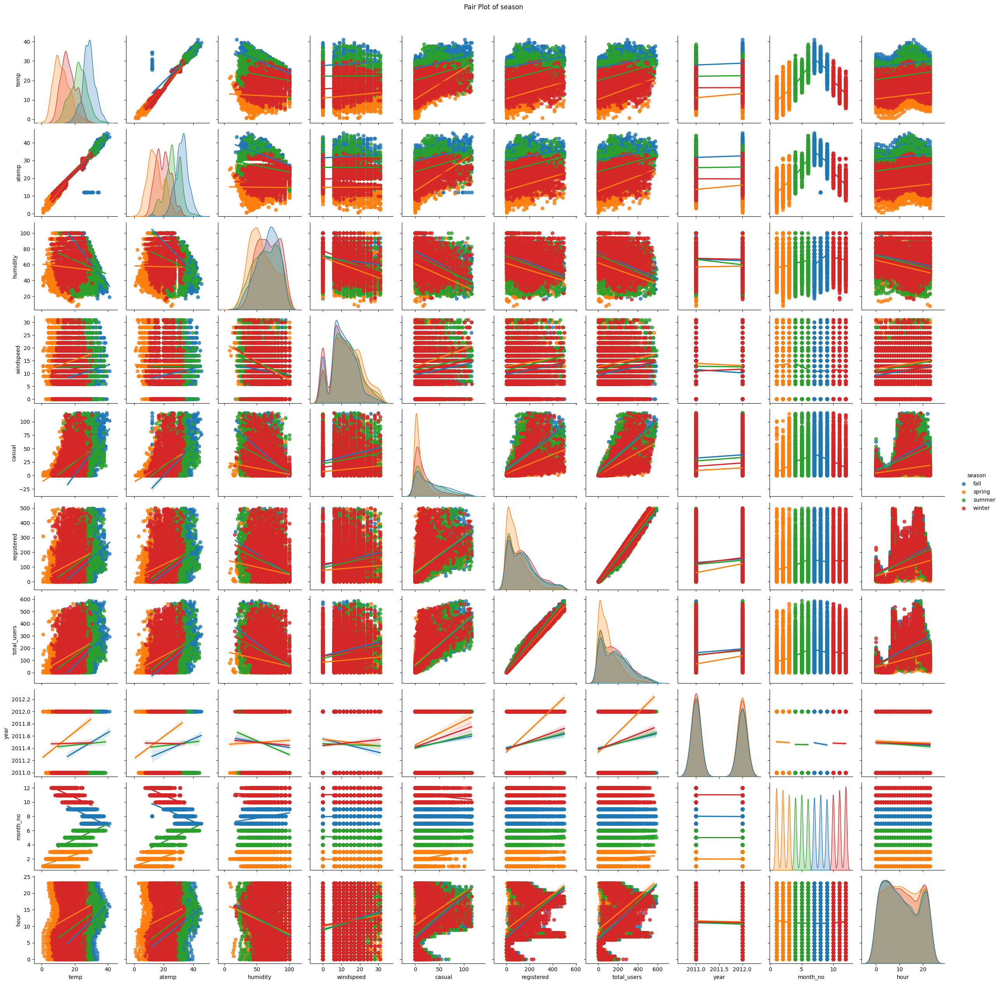

In [ ]:
# Pair Plot with season:
plt.figure(figsize=(10, 5))
sns.pairplot(data=df_iqr, hue="season", kind='reg')
plt.suptitle("Pair Plot of season", y=1.02)
plt.show()

<Figure size 1000x500 with 0 Axes>

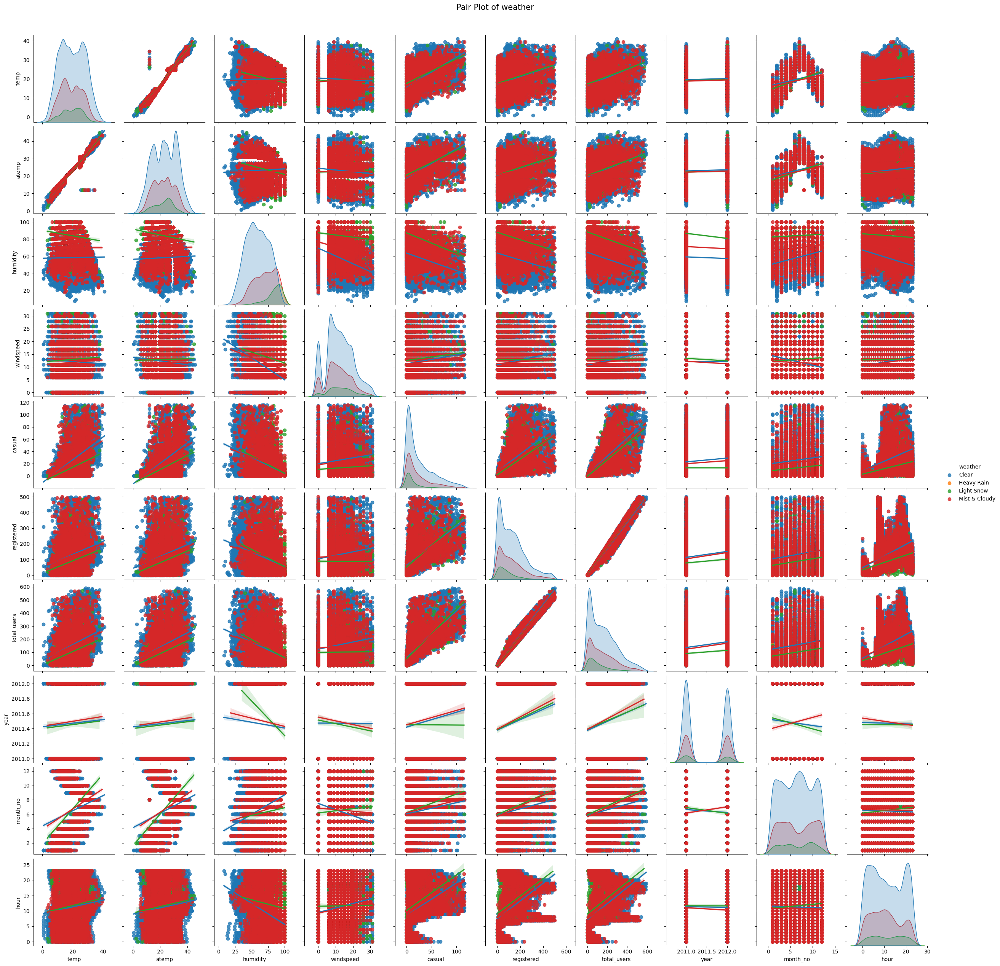

In [ ]:
# Pair Plot with weather:
plt.figure(figsize=(10, 5))
sns.pairplot(data=df_iqr, hue="weather", kind='reg')
plt.suptitle("Pair Plot of weather", y=1.02, fontsize=15)
plt.show()

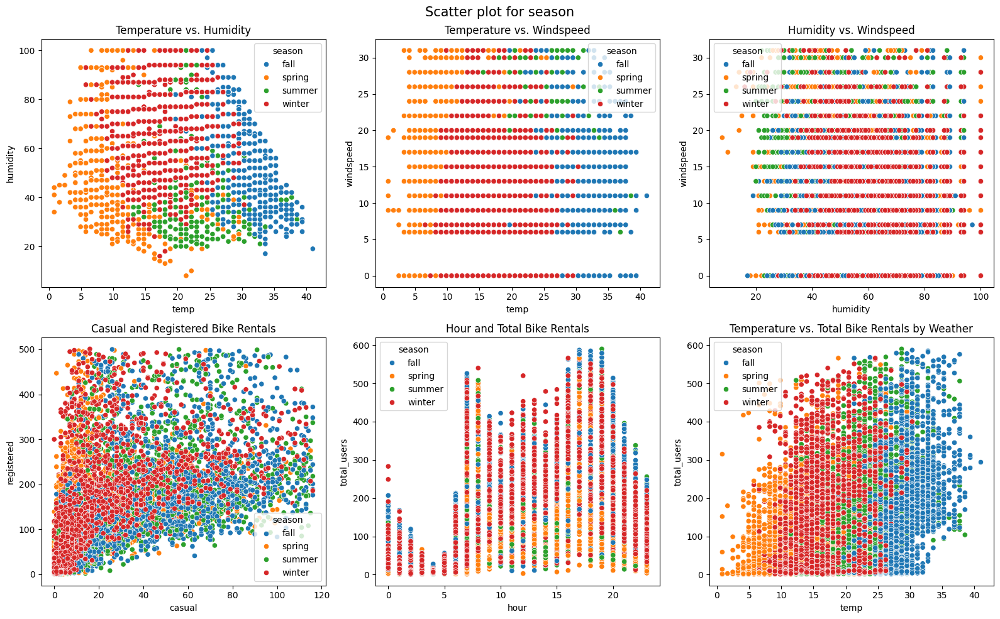

In [124]:
# Scatterr plot for season:
plt.figure(figsize=(16, 10))

# Pair Plot of Temperature Vs. Humidity by season:
plt.subplot(231)
sns.scatterplot(x='temp', y='humidity', data=df_iqr, hue='season')
plt.title('Temperature vs. Humidity')

# Pair Plot of Temperature Vs. Windspeed by season:
plt.subplot(232)
sns.scatterplot(x='temp', y='windspeed', data=df_iqr, hue='season')
plt.title('Temperature vs. Windspeed')

# Pair Plot of Humidity Vs. Windspeed by season:
plt.subplot(233)
sns.scatterplot(x='humidity', y='windspeed', data=df_iqr, hue='season')
plt.title('Humidity vs. Windspeed')

# Pair Plot of Casual and Registered Bike Rentals by season:
plt.subplot(234)
sns.scatterplot(x='casual', y='registered', data=df_iqr, hue='season')
plt.title('Casual and Registered Bike Rentals')

# Pair Plot of Hour and Total Bike Rentals by season:
plt.subplot(235)
sns.scatterplot(x='hour', y='total_users', data=df_iqr, hue='season')
plt.title('Hour and Total Bike Rentals')

# Plot of Temperature and Total Bike Rentals by season:
plt.subplot(236)
sns.scatterplot(x='temp', y='total_users', hue='season',data=df_iqr)
plt.title('Temperature vs. Total Bike Rentals by Weather')

plt.suptitle("Scatter plot for season", fontsize = 15)
plt.tight_layout()
plt.show()

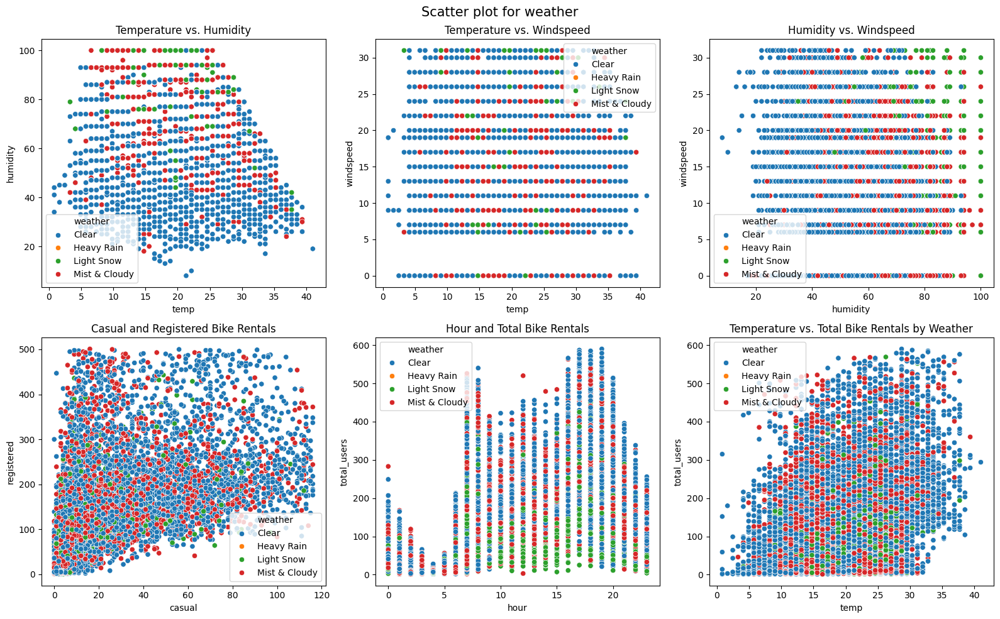

In [123]:
# Scatterr plot for weather:
plt.figure(figsize=(16, 10))

# Pair Plot of Temperature Vs. Humidity by weather:
plt.subplot(231)
sns.scatterplot(x='temp', y='humidity', data=df_iqr, hue='weather')
plt.title('Temperature vs. Humidity')

# Pair Plot of Temperature Vs. Windspeed by weather:
plt.subplot(232)
sns.scatterplot(x='temp', y='windspeed', data=df_iqr, hue='weather')
plt.title('Temperature vs. Windspeed')

# Pair Plot of Humidity Vs. Windspeed by weather:
plt.subplot(233)
sns.scatterplot(x='humidity', y='windspeed', data=df_iqr, hue='weather')
plt.title('Humidity vs. Windspeed')

# Pair Plot of Casual and Registered Bike Rentals by weather:
plt.subplot(234)
sns.scatterplot(x='casual', y='registered', data=df_iqr, hue='weather')
plt.title('Casual and Registered Bike Rentals')

# Pair Plot of Hour and Total Bike Rentals by weather:
plt.subplot(235)
sns.scatterplot(x='hour', y='total_users', data=df_iqr, hue='weather')
plt.title('Hour and Total Bike Rentals')

# Plot of Temperature and Total Bike Rentals by Weather:
plt.subplot(236)
sns.scatterplot(x='temp', y='total_users', hue='weather',data=df_iqr)
plt.title('Temperature vs. Total Bike Rentals by Weather')

plt.suptitle("Scatter plot for weather", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

* The scatterplot between **casual and registered** bike rentals shows a **positive linear relationship** with season and weather, indicating that as the number of casual rentals increases, the number of registered rentals also tends to increase.

* The scatterplot between **temperature and total bike rentals** shows a **positive linear relationship** with season and weather, indicating that as the temperature increases, the number of bike rentals also tends to increase.

# **Hypothesis  Testing🧪**  

**Note:**

The data used below is **after the treatment of outliers.**

# <font color = "jarange">1) Is there any significant difference between the number of bike rides on Weekdays and Weekends?</font>

In [60]:
# Analysis of workingday Vs total_users:
df_iqr.groupby('workingday')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
workingday,,,,,,,,
No,2728.0,120.681085,106.747811,1.0,31.0,89.0,188.0,551.0
Yes,6790.0,161.970103,138.588572,1.0,35.0,138.0,249.0,590.0


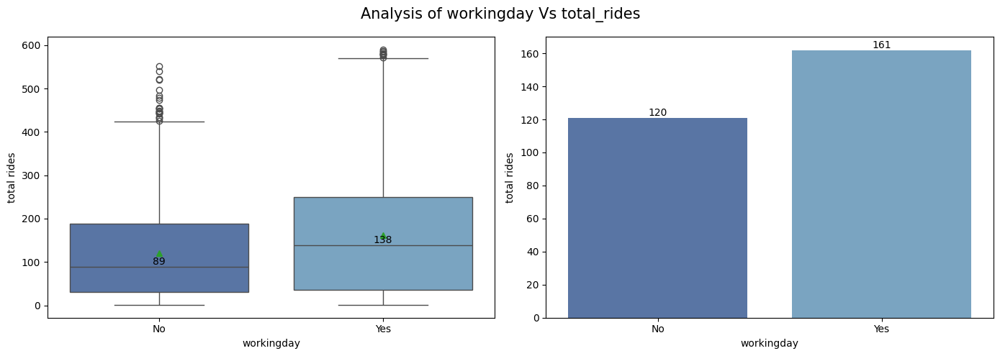

In [61]:
# Analysis of Workingday and Total rides
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df_iqr, x="workingday", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df_iqr.groupby('workingday')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('workingday')
plt.ylabel('total rides')

plt.subplot(1, 2, 2)
gp = df_iqr.groupby("workingday")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='workingday', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')
plt.xlabel('workingday')
plt.ylabel('total rides')

plt.suptitle("Analysis of workingday Vs total_rides", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

After treating the outliers, The number of bike rides in the **working day is high.**

Working day:
* **Mean is 161** and **Median is 138**

Non Working day:
* **Mean is 120** and **Median is 89**

In [62]:
# Preparing the data:
weekdays = df_iqr[df_iqr["workingday"] == "Yes"]["total_users"]
weekends = df_iqr[df_iqr["workingday"] == "No"]["total_users"]


**Framework:**

* **STEP 1:** State the Hypotheses:

  * **Null Hypothesis (Ho)**: There is **no significant difference** between the means bike rides on Weekdays and Weekends.

  * **Alternative Hypothesis (Ha):** There is **significant difference** between the means bike rides on Weekdays and Weekends.

* **STEP 2:** Verify Assumptions:

  * **Independence of Observations:** Ensure that the observations in each group are independent of each other.

  * **Normality:** Check if the data from the groups are approximately normally distributed. we can visually inspect **histograms or use normality tests like Probplot or Shapiro-Wilk test**. If the data is not normal use **BOX-COX transformation**to transform it to normal distribution.
  * **Homogeneity of Variances:** Assess whether the variances of the two groups are approximately equal. We can use statistical tests like **Levene's test**

* **STEP 3:** Select Significance Level (α):
  
  * setting a significance level, **alpha = 5 %**

* **STEP 4:** Define Test statistics:
  * We can perform **Two Sample Independent T-Test** if the assumptions of T Test are met else we will perform the non parametric test equivalent to T Test for independent sample i.e., Mann-Whitney U test

  * We will be perform **Two tailed test**

* **STEP 5:**

  * Calculate the Test statistic and P-Value for **Two Sample Independent T-Test**

* **STEP 6:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.

**Histplot for Normal Data:**

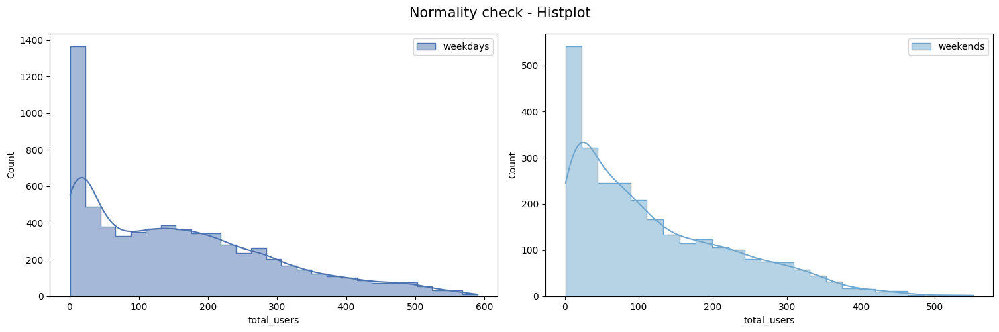

In [63]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.histplot(data = weekdays, kde = True, color=shades_of_blue[0], label = "weekdays", element = 'step')
plt.legend()

plt.subplot(1, 2, 2)
sns.histplot(data = weekends, kde = True, color=shades_of_blue[1], label = "weekends", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [64]:
# skewness and kurtosis coefficient:
day_list = {'weekdays':weekdays, 'weekends': weekends}

for name, data in day_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , data.skew().round(2))
  print("kurtosis coefficient:" , data.kurt().round(2))
  print()

Data weekdays:
skewness coefficient: 0.79
kurtosis coefficient: -0.13

Data weekends:
skewness coefficient: 0.98
kurtosis coefficient: 0.25



**🔍OBSERVATION🔎**

Skewness:
* **Data weekdays:** Skewness coefficient of **0.79** indicates a **moderate right skewness.**
* **Data weekends:** Skewness coefficient of **0.98** indicates a **moderate right skewness.**

Kurtosis:
* **Data weekdays:** Kurtosis coefficient of **-0.13** indicates **slight platykurtic(Flat) distribution.**
* **Data weekends:** Kurtosis coefficient of **0.25** indicates **slightly leptokurtic(Pointy) distribution.**

**Prob plot for Normal data:**

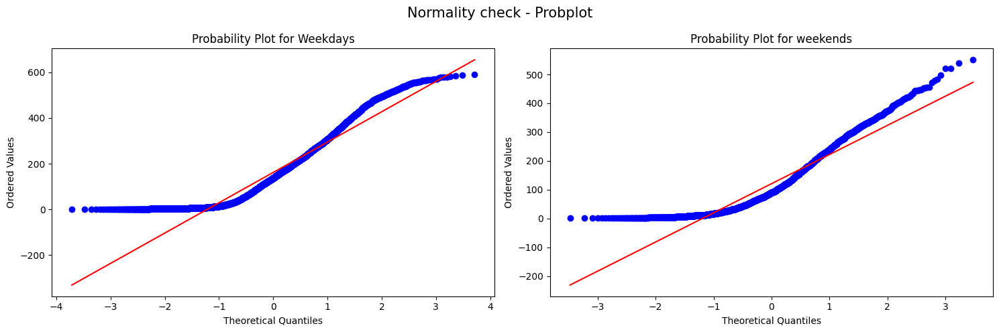

In [65]:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
stats.probplot(weekdays, dist="norm", plot=plt)
plt.title("Probability Plot for Weekdays")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 2, 2)
stats.probplot(weekends, dist="norm", plot=plt)
plt.title("Probability Plot for weekends")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

Both datas are not normal.

**Box-cox Transformation:**

In [66]:
# Creating Boxcossed data:
from scipy.stats import boxcox
boxcoxed_weekdays , best_lambda1 = boxcox(weekdays)
boxcoxed_weekends , best_lambda2 = boxcox(weekends)

**Histplot for Box-coxed data:**

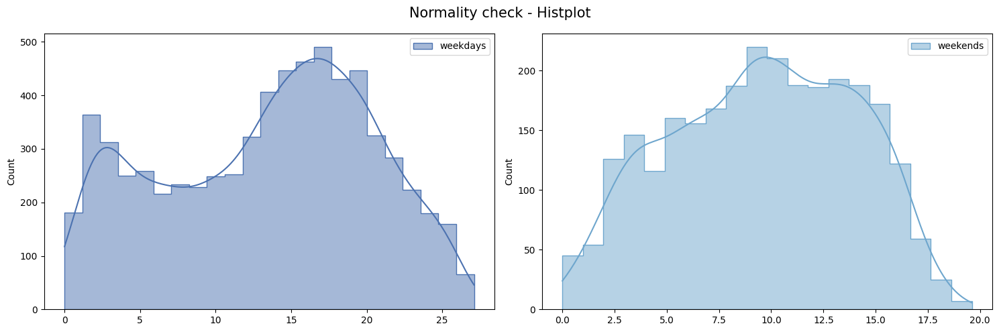

In [67]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.histplot(data = boxcoxed_weekdays, kde = True, color=shades_of_blue[0], label = "weekdays", element = 'step')
plt.legend()

plt.subplot(1, 2, 2)
sns.histplot(data = boxcoxed_weekends, kde = True, color=shades_of_blue[1], label = "weekends", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [68]:
# skewness and kurtosis coefficient:
day_list = {'weekdays':boxcoxed_weekdays, 'weekends': boxcoxed_weekends}

for name, data in day_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , pd.Series(data).skew().round(2))
  print("kurtosis coefficient:" , pd.Series(data).kurt().round(2))
  print()

Data weekdays:
skewness coefficient: -0.23
kurtosis coefficient: -0.99

Data weekends:
skewness coefficient: -0.13
kurtosis coefficient: -0.9



**🔍OBSERVATION🔎**

Skewness:
* **Data weekdays:** Skewness coefficient of **-0.23** indicates a **slight left skewness.**
* **Data weekends:** Skewness coefficient of **-0.13** indicates a **slight left skewness.**

Kurtosis:
* **Data weekdays:** Kurtosis coefficient of **-0.99** indicates **slight platykurtic(Flat) distribution.**
* **Data weekends:** Kurtosis coefficient of **-0.9** indicates **slight platykurtic(Flat) distribution..**

**Prob plot for Box-coxed data:**

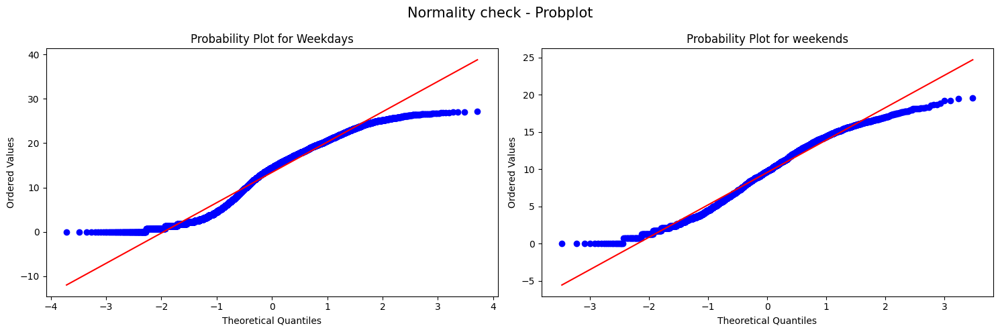

In [69]:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
stats.probplot(boxcoxed_weekdays, dist="norm", plot=plt)
plt.title("Probability Plot for Weekdays")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 2, 2)
stats.probplot(boxcoxed_weekends, dist="norm", plot=plt)
plt.title("Probability Plot for weekends")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

Both datas are not normal.

**Shapiro-Wilk test:**

**Shapiro-Wilk test for Normal Data::**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [70]:
from scipy.stats import shapiro
day_list = {'weekdays':weekdays, 'weekends': weekends}

for name, data in day_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9170000553131104 , p_value : 0.0
Data weekdays is not Gaussian distribution

shapiro_stat : 0.8963597416877747 , p_value : 1.6402717005353784e-39
Data weekends is not Gaussian distribution



**Shapiro-Wilk test for Box-coxed data::**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [71]:
from scipy.stats import shapiro
day_list = {'weekdays':boxcoxed_weekdays, 'weekends': boxcoxed_weekends}

for name, data in day_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9626383781433105 , p_value : 1.2501674440384605e-38
Data weekdays is not Gaussian distribution

shapiro_stat : 0.9792051315307617 , p_value : 1.4970016165482352e-19
Data weekends is not Gaussian distribution



**🔍OBSERVATION🔎**

Both datas are not normal.

**Levene's test:**

  * **Null Hypothesis (Ho)**:  Variances of the two groups are approximately equal.

  * **Alternative Hypothesis (Ha):**  Variances of the two groups are different.


In [72]:
# Calculate the Test stastistics and p_value:
from scipy.stats import levene
levene_stat, p_value = levene(weekdays, weekends)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print("Variances of the two groups are different")
else:
    print("Variances of the two groups are approximately equal")

Levene_stat :  232.23283443276156
p-value :  7.927650077398614e-52
Variances of the two groups are different


**🔍OBSERVATION🔎**

* To find is there any significant difference between the number of bike rides on Weekdays and Weekends, **if the distribution follow gaussian** we would have gone to **Two Sample Independent T-Test (Two Tailed)**

* According to the STEP 2: Verify Assumptions, we have found that the **data does not follow gaussian** so we can go for Non parametric test **(Mann-Whitney U test also known as the Wilcoxon rank-sum test)**



**Mann-Whitney U test(Two Tailed):**

**Framework:**

* **STEP 1:**

  * **Null Hypothesis (Ho)**: There is **no difference** (in terms of central tendency) between weekdays and weekends

  * **Alternative Hypothesis (Ha):** There **is a difference** (with respect to the central tendency) between between weekdays and weekends.

* **STEP 2:**
  
  * setting a significance level, **alpha(α) = 5 %**

* **STEP 3:**

  * Calculate the Test statistic and P-Value for Mann-Whitney U test.

* **STEP 4:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.


In [73]:
from scipy.stats import mannwhitneyu
test_stat, p_value = mannwhitneyu(weekdays, weekends, alternative='two-sided')

print('test_stat : ', test_stat)
print('p-value : ', p_value)
print()
print("CONCLUSION:")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print('There is a difference (with respect to the central tendency) between between weekdays and weekends.')
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('There is no difference (in terms of central tendency) between weekdays and weekends')

test_stat :  10575092.5
p-value :  2.313724124540909e-27

CONCLUSION:
Reject Null Hypothesis
There is a difference (with respect to the central tendency) between between weekdays and weekends.


**🔍OBSERVATION🔎**

* Based on the Mann-Whitney U test, we can conclude that **there is significant difference between the number of bike rides on Weekdays and Weekends.**

* The mean of **weekdays(161.97) which is greater than mean of weekends(120.68)** we can perform Mann-Whitney U test (Right Tailed) to find the weekdays is significantly grater than weekends.



**Mann-Whitney U test(Right Tailed):**

**Framework:**

* **STEP 1:**

  * **Null Hypothesis (Ho)**: There is **no difference** (in terms of central tendency) between weekdays and weekends

  * **Alternative Hypothesis (Ha):** The central tendency of **weekdays is greater than weekends**

* **STEP 2:**
  
  * setting a significance level, **alpha(α) = 5 %**

* **STEP 3:**

  * Calculate the Test statistic and P-Value for Mann-Whitney U test.

* **STEP 4:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.

In [74]:
from scipy.stats import mannwhitneyu
test_stat, p_value = mannwhitneyu(weekdays, weekends, alternative='greater')

print('test_stat : ', test_stat)
print('p-value : ', p_value)
print()
print("CONCLUSION:")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print('The central tendency of weekdays is greater than weekends')
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('There is no difference (in terms of central tendency) between weekdays and weekends')

test_stat :  10575092.5
p-value :  1.1568620622704545e-27

CONCLUSION:
Reject Null Hypothesis
The central tendency of weekdays is greater than weekends


**🔍CONCLUSION🔎**

* Based on the Mann-Whitney U test(Right Tailed), we can conclude that **the
mean number of bike rides in Weekdays is greater than Weekends.**



---


# <font color = "jarange">2) Is the demand of bicycles on rent is the same or different for different Weather conditions?</font>

In [75]:
# Analysis of weather Vs total_users:
df_iqr.groupby('weather')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
weather,,,,,,,,
Clear,6176.0,157.522021,135.224946,1.0,35.0,132.0,242.0,590.0
Heavy Rain,1.0,164.000000,NaN,164.0,164.0,164.0,164.0,164.0
Light Snow,773.0,102.170763,103.066276,1.0,23.0,70.0,149.0,569.0
Mist & Cloudy,2568.0,146.805685,127.190755,1.0,35.0,120.0,226.0,568.0


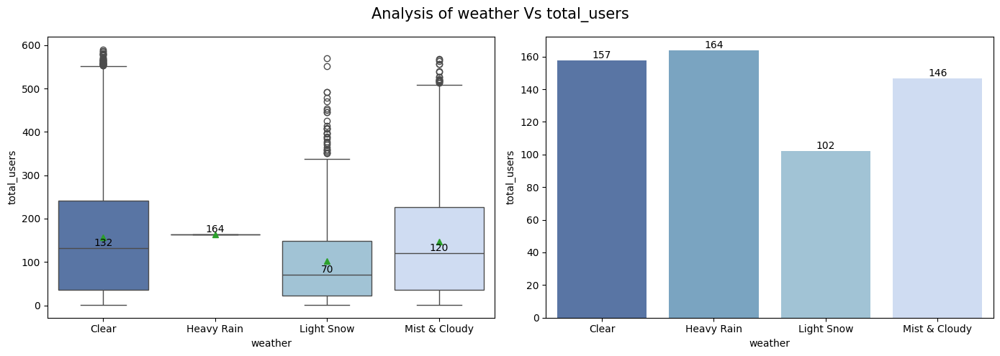

In [76]:
# Analysis of weather Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df_iqr, x="weather", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df_iqr.groupby('weather')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('weather')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df_iqr.groupby("weather")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='weather', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of weather Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

After treating the outliers, The mean and median number of bike rides in the **Clear weather is high.** followed by Mist & Cloudy and Light Snow.

Clear weather:
* **Mean is 157** and **Median is 132**

Mist & Cloudy weather:
* **Mean is 146** and **Median is 120**

Light Snow weather:
* **Mean is 102** and **Median is 70**

In [77]:
# Preparing the data:
Clear = df_iqr[df_iqr["weather"] == "Clear"]["total_users"]
Mist_Cloudy = df_iqr[df_iqr["weather"] == "Mist & Cloudy"]["total_users"]
Light_Snow = df_iqr[df_iqr["weather"] == "Light Snow"]["total_users"]

**Note:**

Since the Heavy Rain has only one data, we can remove that.


**Framework:**

* **STEP 1:** State the Hypotheses:

  * **Null Hypothesis (Ho)**: The mean bikes rented in all the weather are **equal.**

  * **Alternative Hypothesis (Ha):** At least one weather mean is **different** from the others.

* **STEP 2:** Verify Assumptions:

  * **Independence of Observations:** Ensure that the observations in each group are independent of each other.

  * **Normality:** Check if the data from the groups are approximately normally distributed. we can visually inspect **histograms or use normality tests like Probplot or Shapiro-Wilk test**. If the data is not normal use **BOX-COX transformation**to transform it to normal distribution.
  * **Homogeneity of Variances:** Assess whether the variances of the two groups are approximately equal. We can use statistical tests like **Levene's test**

* **STEP 3:** Select Significance Level (α):
  
  * setting a significance level, **alpha = 5 %**

* **STEP 4:** Define Test statistics:
  * The test statistic for a **One-Way ANOVA** is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.
  
  * The test statistic should follow **F-Distribution**.

* **STEP 5:**

  * Calculate the Test statistic and P-Value for **One-Way ANOVA.**

* **STEP 6:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.
  

**Hist Plot for original data:**

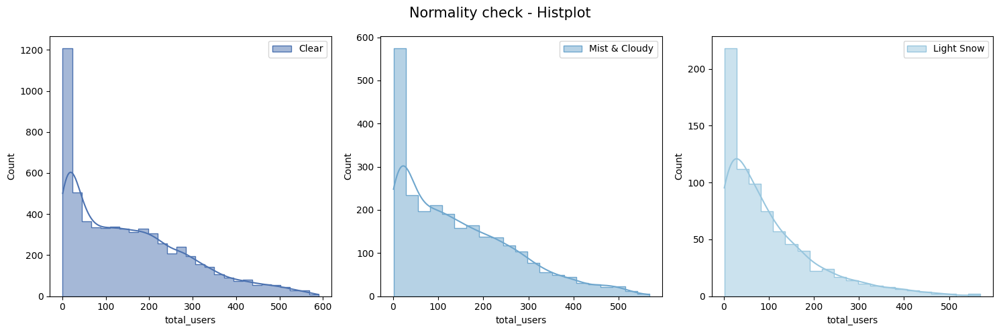

In [78]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(data = Clear, kde = True, color=shades_of_blue[0], label = "Clear", element = 'step')
plt.legend()

plt.subplot(1, 3, 2)
sns.histplot(data = Mist_Cloudy, kde = True, color=shades_of_blue[1], label = "Mist & Cloudy", element = 'step')
plt.legend()

plt.subplot(1, 3, 3)
sns.histplot(data = Light_Snow, kde = True, color=shades_of_blue[2], label = "Light Snow", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [79]:
# skewness and kurtosis coefficient:
weather_list = {'clear':Clear, 'Mist_Cloudy': Mist_Cloudy, 'Light_Snow': Light_Snow}

for name, data in weather_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , data.skew().round(2))
  print("kurtosis coefficient:" , data.kurt().round(2))
  print()

Data clear:
skewness coefficient: 0.83
kurtosis coefficient: -0.03

Data Mist_Cloudy:
skewness coefficient: 0.88
kurtosis coefficient: 0.09

Data Light_Snow:
skewness coefficient: 1.51
kurtosis coefficient: 2.28



**🔍OBSERVATION🔎**

Skewness:
* **Data Clear:** Skewness coefficient of **0.83** indicates a **moderate right skewness.**
* **Data Mist_Cloudy:** Skewness coefficient of **0.88** also indicates a **moderate right skewness.**
* **Data Light_Snow:** Skewness coefficient of **1.51** indicates a **significant right skewness.**

Kurtosis:
* **Data Clear:** Kurtosis coefficient of **-0.03** indicates **slight platykurtic(Flat) distribution.**
* **Data Mist_Cloudy:** Kurtosis coefficient of **0.09** indicates **slightly leptokurtic (Pointy) distribution**
* **Data Light_Snow:** Kurtosis coefficient of **2.28** indicates a **significantly leptokurtic (Pointy) distribution**

**Prob plot for original data:**

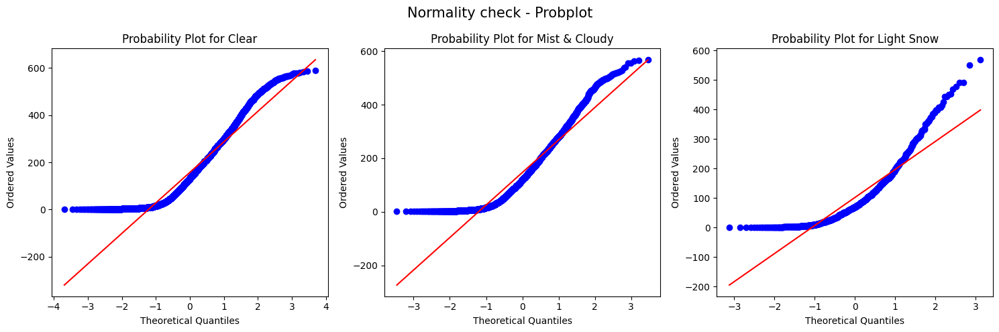

In [80]:
# Probplot:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
stats.probplot(Clear, dist="norm", plot=plt)
plt.title("Probability Plot for Clear")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 3, 2)
stats.probplot(Mist_Cloudy, dist="norm", plot=plt)
plt.title("Probability Plot for Mist & Cloudy")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 3, 3)
stats.probplot(Light_Snow, dist="norm", plot=plt)
plt.title("Probability Plot for Light Snow")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The datas are not normal.

**BOX-COX Transformation:**

In [81]:
# Creating Boxcossed data:
from scipy.stats import boxcox
boxcoxed_Clear , best_lambda1 = boxcox(Clear)
boxcoxed_Mist , best_lambda2 = boxcox(Mist_Cloudy)
boxcoxed_Light_Snow , best_lambda3 = boxcox(Light_Snow)

**Hist plot for Box-cos Transformed data:**

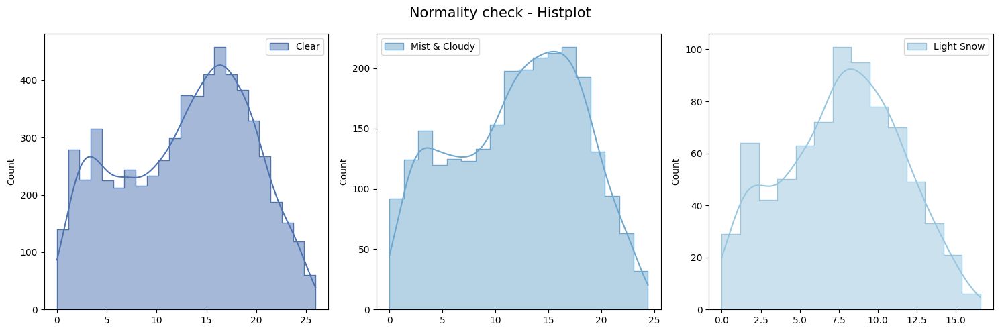

In [82]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(data = boxcoxed_Clear, kde = True, color=shades_of_blue[0], label = "Clear", element = 'step')
plt.legend()

plt.subplot(1, 3, 2)
sns.histplot(data = boxcoxed_Mist, kde = True, color=shades_of_blue[1], label = "Mist & Cloudy", element = 'step')
plt.legend()

plt.subplot(1, 3, 3)
sns.histplot(data = boxcoxed_Light_Snow, kde = True, color=shades_of_blue[2], label = "Light Snow", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [83]:
# skewness and kurtosis coefficient:
weather_list = {'clear':boxcoxed_Clear, 'Mist_Cloudy': boxcoxed_Mist, 'Light_Snow': boxcoxed_Light_Snow}

for name, data in weather_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , pd.Series(data).skew().round(2))
  print("kurtosis coefficient:" , pd.Series(data).kurt().round(2))
  print()

Data clear:
skewness coefficient: -0.21
kurtosis coefficient: -0.98

Data Mist_Cloudy:
skewness coefficient: -0.19
kurtosis coefficient: -0.95

Data Light_Snow:
skewness coefficient: -0.11
kurtosis coefficient: -0.73



**🔍OBSERVATION🔎**

Skewness:
* **Data Clear:** Skewness coefficient of **-0.21** indicates a **slight left skewness.**
* **Data Mist_Cloudy:** Skewness coefficient of **-0.19** also indicates a **slight left skewness.**
* **Data Light_Snow:** Skewness coefficient of **-0.11** indicates a **slight left skewness.**

Kurtosis:
* **Data Clear:** Kurtosis coefficient of **-0.98** indicates **slight platykurtic(Flat) distribution.**
* **Data Mist_Cloudy:** Kurtosis coefficient of **-0.95** indicates **slightly leptokurtic (Pointy) distribution**
* **Data Light_Snow:** Kurtosis coefficient of **-0.73** indicates a **significantly leptokurtic (Pointy) distribution**

**Probplot for Box-cos Transformed data:**

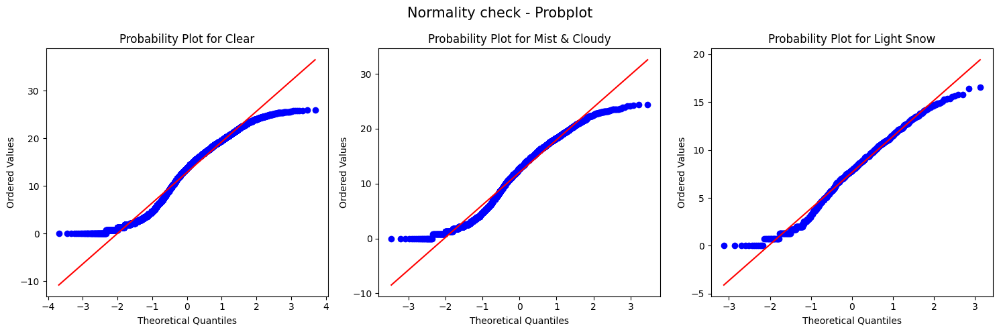

In [84]:
# Probplot:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
stats.probplot(boxcoxed_Clear, dist="norm", plot=plt)
plt.title("Probability Plot for Clear")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 3, 2)
stats.probplot(boxcoxed_Mist, dist="norm", plot=plt)
plt.title("Probability Plot for Mist & Cloudy")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 3, 3)
stats.probplot(boxcoxed_Light_Snow, dist="norm", plot=plt)
plt.title("Probability Plot for Light Snow")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The datas are not normal.

**Shapiro-Wilk test:**

**Shapiro-Wilk test for normal data:**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [85]:
from scipy.stats import shapiro
weather_list = {'clear':Clear, 'Mist_Cloudy': Mist_Cloudy, 'Light_Snow': Light_Snow}

for name, data in weather_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9150597453117371 , p_value : 0.0
Data clear is not Gaussian distribution

shapiro_stat : 0.91085284948349 , p_value : 2.1035535621065664e-36
Data Mist_Cloudy is not Gaussian distribution

shapiro_stat : 0.8443405628204346 , p_value : 7.518643302497174e-27
Data Light_Snow is not Gaussian distribution



**Shapiro-Wilk test for Box-cos Transformed data:**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [86]:
from scipy.stats import shapiro
weather_list = {'clear':boxcoxed_Clear, 'Mist_Cloudy': boxcoxed_Mist, 'Light_Snow': boxcoxed_Light_Snow}

for name, data in weather_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9666452407836914 , p_value : 1.501805814193452e-35
Data clear is not Gaussian distribution

shapiro_stat : 0.970470666885376 , p_value : 1.372310130004907e-22
Data Mist_Cloudy is not Gaussian distribution

shapiro_stat : 0.9829025268554688 , p_value : 7.511636113122222e-08
Data Light_Snow is not Gaussian distribution



**🔍OBSERVATION🔎**

The datas are not normal.

**Levene's test:**

  * **Null Hypothesis (Ho)**:  Variances of the three groups are approximately equal.

  * **Alternative Hypothesis (Ha):**  Variances of the three groups are different.


In [87]:
# Calculate the Test stastistics and p_value:
from scipy.stats import levene
levene_stat, p_value = levene(Clear, Mist_Cloudy, Light_Snow)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print("Variances of the three groups are different")
else:
    print("Variances of the three groups are approximately equal")

Levene_stat :  64.77138368506712
p-value :  1.1479762859567072e-28
Variances of the three groups are different


**🔍OBSERVATION🔎**

* Since the assumptions of One way ANOVA are not met we can go for Non parametric test know as **Kruskal-Wallis test.**

**Kruskal-Wallis test:**

**Framework:**

* **STEP 1:**

  * **Null Hypothesis (Ho)**: The medians of all groups are equal.

  * **Alternative Hypothesis (Ha):** At least one group's median is different from the others.

* **STEP 2:**
  
  * setting a significance level, **alpha(α) = 5 %**

* **STEP 3:**

  * Calculate the Test statistic and P-Value for Kruskal-Wallis test.

* **STEP 4:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.

In [88]:
# Calculate the Test stastistics and p_value:
from scipy.stats import kruskal
test_stat, p_value = kruskal(Clear, Mist_Cloudy, Light_Snow)

print('test_stat : ', test_stat)
print('p-value : ', p_value)
print()
print("CONCLUSION:")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print("At least one group's median is different from the others")
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('The medians of all groups are equal')

test_stat :  115.80878346080586
p-value :  7.1193803165392e-26

CONCLUSION:
Reject Null Hypothesis
At least one group's median is different from the others


**🔍CONCLUSION🔎**

* Based on the Kruskal-Wallis test, we can conclude that **the demand of bicycles on rent is different for different Weather conditions.**

 ---

# <font color = "jarange">3) Is  the demand of bicycles on rent is the same or different for different Seasons?</font>

In [89]:
# Analysis of weather Vs total_users:
df_iqr.groupby('season')['total_users'].describe()

,count,mean,std,min,25%,50%,75%,max
season,,,,,,,,
fall,2288.0,177.151661,141.381497,1.0,43.0,162.0,274.00,587.0
spring,2463.0,103.164028,101.351256,1.0,22.5,76.0,151.00,566.0
summer,2292.0,160.360820,136.243867,1.0,34.0,136.5,250.25,590.0
winter,2475.0,162.437172,132.658631,1.0,42.0,140.0,245.00,566.0


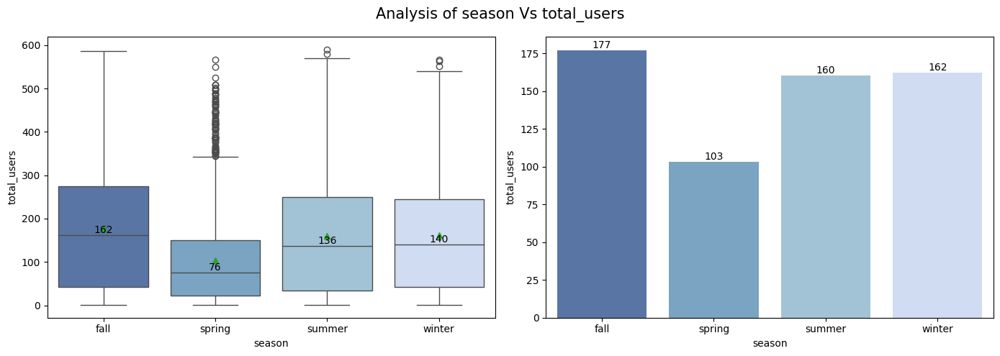

In [90]:
# Analysis of season Vs total_users:
plt.figure(figsize=(14, 5))
shades_of_blue = ['#4c72b0', '#6ea6cd', '#98c6de', '#c9daf8', '#e0ecf4']

plt.subplot(1, 2, 1)
sns.boxplot(data = df_iqr, x="season", y="total_users", palette = shades_of_blue, showmeans=True)
medians = df_iqr.groupby('season')['total_users'].median()
for i, median in enumerate(medians):
    plt.text(i, median, f'{median:.0f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontsize=10)
plt.xlabel('season')
plt.ylabel('total_users')

plt.subplot(1, 2, 2)
gp = df_iqr.groupby("season")["total_users"].mean().to_frame().reset_index()
label = sns.barplot(data = gp, x='season', y = 'total_users', palette = shades_of_blue)
for i in label.containers:
    label.bar_label(i,label_type='edge',fmt='%d')

plt.suptitle("Analysis of season Vs total_users", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

After treating the outliers, The mean and median number of bike rides in the **fall season is high** followed by winter, summer and Spring.

Fall season:
* **Mean is 177** and **Median is 162**

Winter season:
* **Mean is 162** and **Median is 140**

Summer season:
* **Mean is 160** and **Median is 136**

Spring season:
* **Mean is 103** and **Median is 76**




In [91]:
# Preparing the data:
winter = df_iqr[df_iqr["season"] == "winter"]["total_users"]
spring = df_iqr[df_iqr["season"] == "spring"]["total_users"]
summer = df_iqr[df_iqr["season"] == "summer"]["total_users"]
fall = df_iqr[df_iqr["season"] == "fall"]["total_users"]

**Framework:**

* **STEP 1:** State the Hypotheses:

  * **Null Hypothesis (Ho)**: The mean bikes rented in all the season are **equal.**

  * **Alternative Hypothesis (Ha):** At least one season mean is **different** from the others.

* **STEP 2:** Verify Assumptions:

  * **Independence of Observations:** Ensure that the observations in each group are independent of each other.

  * **Normality:** Check if the data from the groups are approximately normally distributed. we can visually inspect **histograms or use normality tests like Probplot or Shapiro-Wilk test**. If the data is not normal use **BOX-COX transformation**to transform it to normal distribution.
  * **Homogeneity of Variances:** Assess whether the variances of the two groups are approximately equal. We can use statistical tests like **Levene's test**

* **STEP 3:** Select Significance Level (α):
  
  * setting a significance level, **alpha = 5 %**

* **STEP 4:** Define Test statistics:
  * The test statistic for a **One-Way ANOVA** is denoted as F. For an independent variable with k groups, the F statistic evaluates whether the group means are significantly different.
  
  * The test statistic should follow **F-Distribution**.

* **STEP 5:**

  * Calculate the Test statistic and P-Value for **One-Way ANOVA.**

* **STEP 6:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.
  

**Histplot for Normal data:**

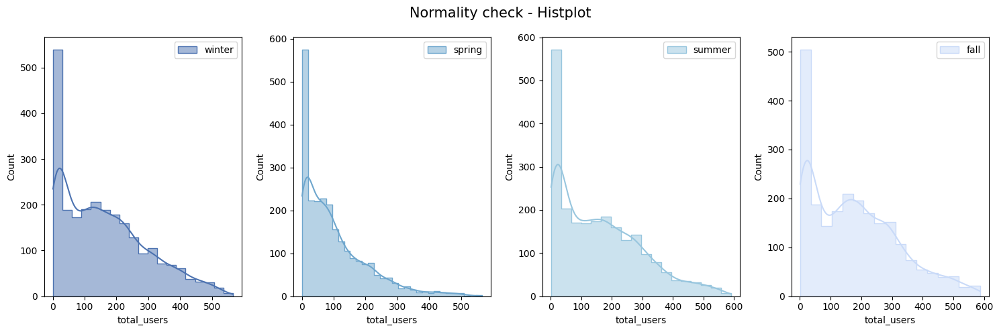

In [92]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
sns.histplot(data = winter, kde = True, color=shades_of_blue[0], label = "winter", element = 'step')
plt.legend()

plt.subplot(1, 4, 2)
sns.histplot(data = spring, kde = True, color=shades_of_blue[1], label = "spring", element = 'step')
plt.legend()

plt.subplot(1, 4, 3)
sns.histplot(data = summer, kde = True, color=shades_of_blue[2], label = "summer", element = 'step')
plt.legend()

plt.subplot(1, 4, 4)
sns.histplot(data = fall, kde = True, color=shades_of_blue[3], label = "fall", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [93]:
# skewness and kurtosis coefficient:
season_list = {'Winter':winter, 'Spring': spring, 'Summer': summer, 'Fall': fall}

for name, data in season_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , data.skew().round(2))
  print("kurtosis coefficient:" , data.kurt().round(2))
  print()

Data Winter:
skewness coefficient: 0.7
kurtosis coefficient: -0.31

Data Spring:
skewness coefficient: 1.43
kurtosis coefficient: 2.06

Data Summer:
skewness coefficient: 0.78
kurtosis coefficient: -0.11

Data Fall:
skewness coefficient: 0.66
kurtosis coefficient: -0.3



**🔍OBSERVATION🔎**

Skewness:

* **Data Winter:** Skewness coefficient of **0.7** indicates a **moderate right skewness.**
* **Data Spring:** Skewness coefficient of **1.43** indicates a **significant right skewness.**
* **Data Summer:** Skewness coefficient of **0.78** indicates a **moderate right skewness.**
* **Data Fall:** Skewness coefficient of **0.66** indicates a **moderate right skewness.**

Kurtosis:
* **Data Winter:** Kurtosis coefficient of **-0.31** indicates **slight platykurtic(Flat) distribution.**
* **Data Spring:** Kurtosis coefficient of **2.06** indicates **significantly leptokurtic(Pointy) distribution.**
* **Data Summer:** Kurtosis coefficient of **-0.11** indicates **slight platykurtic(Flat) distribution.**
* **Data Fall:** Kurtosis coefficient of **-0.3** indicates **slight platykurtic(Flat) distribution.**

**Probplot for Normal Data:**

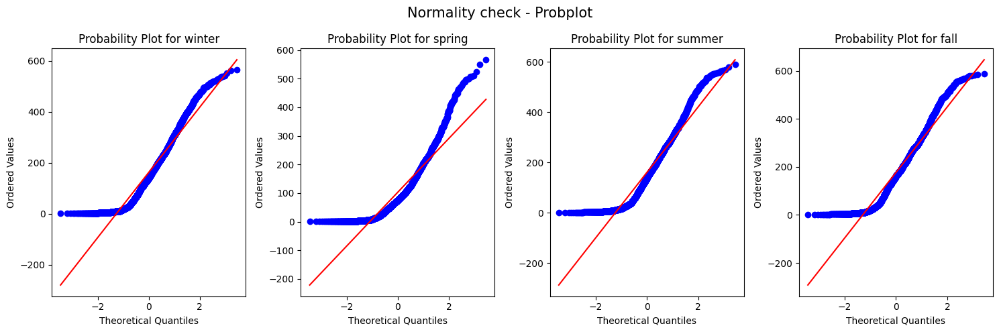

In [94]:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
stats.probplot(winter, dist="norm", plot=plt)
plt.title("Probability Plot for winter")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 2)
stats.probplot(spring, dist="norm", plot=plt)
plt.title("Probability Plot for spring")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 3)
stats.probplot(summer, dist="norm", plot=plt)
plt.title("Probability Plot for summer")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 4)
stats.probplot(fall, dist="norm", plot=plt)
plt.title("Probability Plot for fall")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The datas are not normal.

**BOX-COX Transformation:**

In [95]:
# Creating Boxcossed data:
from scipy.stats import boxcox
boxcoxed_winter , best_lambda1 = boxcox(winter)
boxcoxed_spring , best_lambda2 = boxcox(spring)
boxcoxed_summer , best_lambda3 = boxcox(summer)
boxcoxed_fall , best_lambda4 = boxcox(fall)

**Histplot for Box-cox transformed data:**

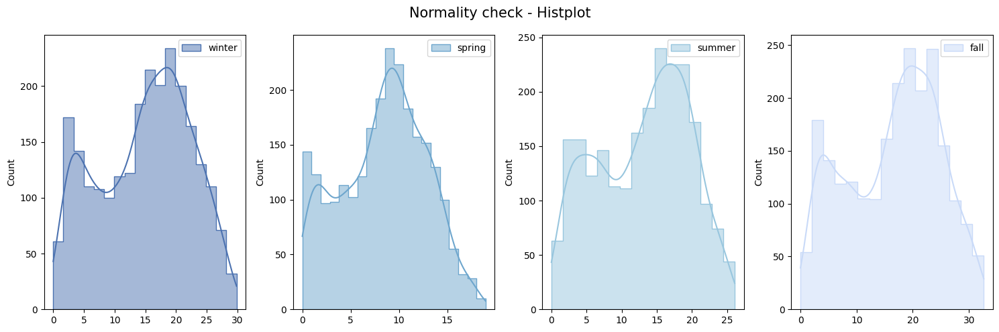

In [96]:
# Normality check - Histplot
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
sns.histplot(data = boxcoxed_winter, kde = True, color=shades_of_blue[0], label = "winter", element = 'step')
plt.legend()

plt.subplot(1, 4, 2)
sns.histplot(data = boxcoxed_spring, kde = True, color=shades_of_blue[1], label = "spring", element = 'step')
plt.legend()

plt.subplot(1, 4, 3)
sns.histplot(data = boxcoxed_summer, kde = True, color=shades_of_blue[2], label = "summer", element = 'step')
plt.legend()

plt.subplot(1, 4, 4)
sns.histplot(data = boxcoxed_fall, kde = True, color=shades_of_blue[3], label = "fall", element = 'step')
plt.legend()

plt.suptitle("Normality check - Histplot", fontsize = 15)
plt.tight_layout()
plt.show()

In [97]:
# skewness and kurtosis coefficient:
season_list = {'Winter':boxcoxed_winter, 'Spring': boxcoxed_spring, 'Summer': boxcoxed_summer, 'Fall': boxcoxed_fall}

for name, data in season_list.items():
  print(f"Data {name}:")
  print("skewness coefficient:" , pd.Series(data).skew().round(2))
  print("kurtosis coefficient:" , pd.Series(data).kurt().round(2))
  print()

Data Winter:
skewness coefficient: -0.22
kurtosis coefficient: -0.98

Data Spring:
skewness coefficient: -0.14
kurtosis coefficient: -0.75

Data Summer:
skewness coefficient: -0.21
kurtosis coefficient: -1.02

Data Fall:
skewness coefficient: -0.23
kurtosis coefficient: -0.99



**🔍OBSERVATION🔎**

Skewness:
* **Data Winter:** Skewness coefficient of **-0.22** indicates a **slight left skewness.**
* **Data Spring:** Skewness coefficient of **-0.14** also indicates a **slight left skewness.**
* **Data Summer:** Skewness coefficient of **-0.21** indicates a **slight left skewness.**
* **Data Fall:** Skewness coefficient of **-0.23** indicates a **slight left skewness.**

Kurtosis:

* **Data Winter:** Kurtosis coefficient of **-0.98** indicates **slightly platykurtic(Flat) distribution.**
* **Data Spring:** Kurtosis coefficient of **-0.75** also indicates **slightly platykurtic(Flat) distribution.**
* **Data Summer:** Kurtosis coefficient of **-1.02** indicates **slightly platykurtic(Flat) distribution.**
* **Data Fall:** Kurtosis coefficient of **-0.99** indicates **slightly platykurtic(Flat) distribution.**

**Probplot for Box-cox transformed data:**

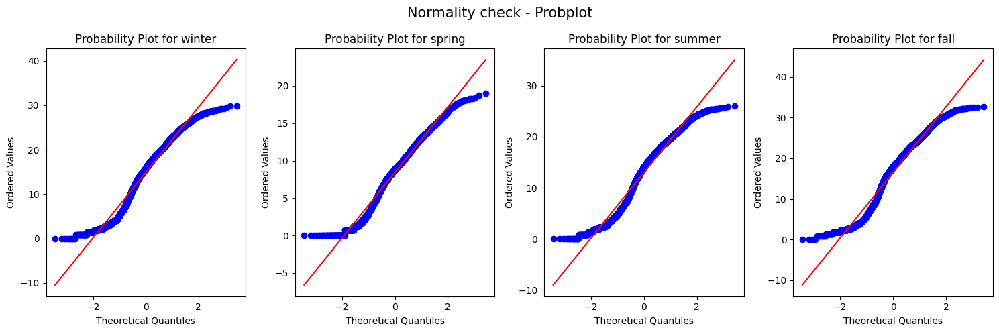

In [98]:
import scipy.stats as stats

plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
stats.probplot(boxcoxed_winter, dist="norm", plot=plt)
plt.title("Probability Plot for winter")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 2)
stats.probplot(boxcoxed_spring, dist="norm", plot=plt)
plt.title("Probability Plot for spring")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 3)
stats.probplot(boxcoxed_summer, dist="norm", plot=plt)
plt.title("Probability Plot for summer")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.subplot(1, 4, 4)
stats.probplot(boxcoxed_fall, dist="norm", plot=plt)
plt.title("Probability Plot for fall")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")

plt.suptitle("Normality check - Probplot", fontsize = 15)
plt.tight_layout()
plt.show()

**🔍OBSERVATION🔎**

The datas are not normal.

**Shapiro-Wilk test:**

**Shapiro-Wilk test for Normal Data:**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [99]:
from scipy.stats import shapiro
season_list = {'Winter':winter, 'Spring': spring, 'Summer': summer, 'Fall': fall}

for name, data in season_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9272552728652954 , p_value : 4.5287389233367154e-33
Data Winter is not Gaussian distribution

shapiro_stat : 0.8594179153442383 , p_value : 2.0725204287364044e-42
Data Spring is not Gaussian distribution

shapiro_stat : 0.9176210165023804 , p_value : 1.2426929547549821e-33
Data Summer is not Gaussian distribution

shapiro_stat : 0.9323311448097229 , p_value : 5.115096899524057e-31
Data Fall is not Gaussian distribution



In [100]:
# Creating Log normal data:
from scipy.stats import boxcox
boxcoxed_winter , best_lambda1 = boxcox(winter)
boxcoxed_spring , best_lambda2 = boxcox(spring)
boxcoxed_summer , best_lambda3 = boxcox(summer)
boxcoxed_fall , best_lambda4 = boxcox(fall)

**Shapiro-Wilk test for Box-cos Transformed data:**

  * **Null Hypothesis (Ho)**: The Data is Gaussian

  * **Alternative Hypothesis (Ha):** The Data is not Gaussian

In [101]:
from scipy.stats import shapiro
season_list = {'Winter':boxcoxed_winter, 'Spring': boxcoxed_spring, 'Summer': boxcoxed_summer, 'Fall': boxcoxed_fall}

for name, data in season_list.items():
  shapiro_stat , p_val = shapiro(data)
  print(f"shapiro_stat : {shapiro_stat} , p_value : {p_val}")

  if p_val < 0.05:
    print(f'Data {name} is not Gaussian distribution')
    print()
  else:
    print(f'Data {name} is Gaussian distribution')
    print()

shapiro_stat : 0.9634298086166382 , p_value : 1.5041716736904505e-24
Data Winter is not Gaussian distribution

shapiro_stat : 0.9780347943305969 , p_value : 4.790664597473964e-19
Data Spring is not Gaussian distribution

shapiro_stat : 0.9630948901176453 , p_value : 9.62462211417198e-24
Data Summer is not Gaussian distribution

shapiro_stat : 0.9601859450340271 , p_value : 1.4045605308587698e-24
Data Fall is not Gaussian distribution



**🔍OBSERVATION🔎**

The datas are not normal.

**Levene's test:**

  * **Null Hypothesis (Ho)**:  Variances of the three groups are approximately equal.

  * **Alternative Hypothesis (Ha):**  Variances of the three groups are different.

In [102]:
# Calculate the Test stastistics and p_value:
from scipy.stats import levene
levene_stat, p_value = levene(winter, spring, summer, fall)

print('Levene_stat : ', levene_stat)
print('p-value : ', p_value)

if p_value < 0.05:
    print("Variances of the three groups are different")
else:
    print("Variances of the three groups are approximately equal")

Levene_stat :  137.00312941554566
p-value :  6.687186315723853e-87
Variances of the three groups are different


**🔍OBSERVATION🔎**

* Since the assumptions of One way ANOVA are not met we can go for Non parametric test know as **Kruskal-Wallis test.**

**Kruskal-Wallis test:**

**Framework:**

* **STEP 1:**

  * **Null Hypothesis (Ho)**: The medians of all groups are equal.

  * **Alternative Hypothesis (Ha):** At least one group's median is different from the others.

* **STEP 2:**
  
  * setting a significance level, **alpha(α) = 5 %**

* **STEP 3:**

  * Calculate the Test statistic and P-Value for Kruskal-Wallis test.

* **STEP 4:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.

In [103]:
# Calculate the Test stastistics and p_value:
from scipy.stats import kruskal
test_stat, p_value = kruskal(winter, spring, summer, fall)

print('test_stat : ', test_stat)
print('p-value : ', p_value)
print()
print("CONCLUSION:")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print("At least one group's median is different from the others")
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('The medians of all groups are equal')

test_stat :  429.48146575018467
p-value :  9.09294670507136e-93

CONCLUSION:
Reject Null Hypothesis
At least one group's median is different from the others


**🔍CONCLUSION🔎**

* Based on the Kruskal-Wallis test, we can conclude that **the demand of bicycles on rent is different for different Seasons.**

 ---
 

# <font color = "jarange">4) Is the Weather conditions are significantly different during different Seasons?</font>

In [104]:
observed = pd.crosstab(index = df_iqr["season"], columns = df_iqr["weather"])
observed

weather,Clear,Heavy Rain,Light Snow,Mist & Cloudy
season,,,,
fall,1598,0,173,517
spring,1595,1,184,683
summer,1473,0,205,614
winter,1510,0,211,754


**Framework:**

* **STEP 1:** State the Hypotheses:

  * **Null Hypothesis (Ho)**: Season and Weather are **independent.**

  * **Alternative Hypothesis (Ha):** Season and Weather are **dependent.**

* **STEP 2:** Select Significance Level (α):
  
  * setting a significance level, **alpha = 5 %**

* **STEP 3:** Define Test statistics:
  * We can perform **Chi-square (Independence of test)**
  
  * The test statistic should follow **Chi-Distribution**.

* **STEP 4:** Assumptions:
  * **Categorical Data:** The variables under study should be categorical.

  * **Independence of Observations:** The observations or data points used in the Chi-square test should be independent of each other.

  * **Sample Size:** The sample size should be sufficiently large. A common guideline is that each expected cell count in the contingency table (expected frequency) should be at least 5.

* **STEP 5:**

  * Calculate the Test statistic and P-Value for **Chi-square (Independence of test)**

* **STEP 6:**
  * Compare the p-value to the significance level (α) and accept/reject the Null Hypothesis accordingly.

In [105]:
# Calculate Stastistics and p-value:
from scipy.stats import chi2_contingency
chi_stat, p_value, dof, exp_freq = chi2_contingency(observed)

print('test_stat : ', chi_stat)
print('p-value : ', p_value)
print('Expected frequency : ', exp_freq)
print('DOF : ', dof)
print()
print("CONCLUSION:")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print("Season and Weather are dependent")
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('Season and Weather are independent')

test_stat :  49.95660707768859
p-value :  1.0976664201931232e-07
Expected frequency :  [[1.48462786e+03 2.40386636e-01 1.85818870e+02 6.17312881e+02]
 [1.59818113e+03 2.58772851e-01 2.00031414e+02 6.64528682e+02]
 [1.48722337e+03 2.40806892e-01 1.86143728e+02 6.18392099e+02]
 [1.60596764e+03 2.60033621e-01 2.01005989e+02 6.67766337e+02]]
DOF :  9

CONCLUSION:
Reject Null Hypothesis
Season and Weather are dependent


**🔍CONCLUSION🔎**

* Based on the Chi-square (Independence of test), we can conclude that the **Weather conditions are not significantly different during different Seasons ie) Season and Weather are dependent to each other.**

---


# **Inference✌**

* **<font color = "jarange">Users🎯</font>**
  * The number of bikes rentals by **Registered users are more🤑**
  * As the **number of casual rentals increases**, the number of **registered rentals also tends to increase🔥**

* **<font color = "jarange">Seasons🎯</font>**
  * The mean number of bike rides in the **fall season is high** followed by winter, summer and Spring. **The average number of bikes needed to be maintained in the inventory** for the following seasons are,

    * **Fall season:** 180 bikes🚴
    * **Winter season:** 160 bikes🚴
    * **Summer season:** 160 bikes🚴
    * **Spring season:** 100 bikes🚴

* **<font color = "jarange">Working Day or Holiday🎯</font>**
  * The number of bikes rentals in the **working day is high.** and **the average number of bikes needed to be maintained in the inventory** for the following days are,

    * **Working day:** 160 bikes🚴
    * **Non Working day:** 120 bikes🚴
    * **Holiday:** 130 bikes🚴

* **<font color = "jarange">Weather🎯</font>**
  * The mean number of bike rides in the **Clear weather is high.** followed by Mist & Cloudy and Light Snow. **The average number of bikes needed to be maintained in the inventory** for the following weather are,

    * **Clear weather:** 160 bikes🚴
    * **Mist & Cloudy weather:** 150 bikes🚴
    * **Light Snow weather:** 100 bikes🚴

* **<font color = "jarange">Hour🎯</font>**
  * The average number of bookings is **high in Morning 8 am** and **Evening 5 pm**
  * There is highest **demand** for bike rides are from **Morning 7 am to 9 am** and **Evening 4 pm to 7 pm.**

  * **The average number of bikes needed to be maintained in the inventory** are for the following weather are,
    * **Morning peak hours:** 270 bikes🚴
    * **Evening peak hours:** 380 bikes🚴
    * **Morning 7 am to Evening 7 pm:** 290 bikes🚴
    * **Non active hours:** 80 bikes🚴


# **Inference from Hypothesis Testing✌**

From the Hypothesis Testing we have concluded the following,

*  **<font color = "jarange">Is there any significant difference between the number of bike rides on Weekdays and Weekends?</font>**
   * The mean number of bike rides in **Weekdays is significantly greater than Weekends.**
   

* **<font color = "jarange">Is the demand of bicycles on rent is the same or different for different Weather conditions?</font>**
  * The **demand** of bicycles on rent is **different for different Weather conditions.**
  

* **<font color = "jarange">Is  the demand of bicycles on rent is the same or different for different Seasons?</font>**
  * The **demand** of bicycles on rent is **different for different Seasons.**
  

* **<font color = "jarange">Is the Weather conditions are significantly different during different Seasons?</font>**
  * Weather conditions are **not significantly different** during different Seasons ie) **Season and Weather are dependent to each other.**

# **Recommendations🤝**

* **<font color = "jarange">Targeted Marketing Campaigns💡</font>**

    * Develop targeted marketing campaigns to **attract and retain registered users**, as they constitute a significant portion of bike rentals. **Offer incentives or discounts for registered users** to encourage repeat rentals and loyalty.

* **<font color = "jarange">Customer Segmentation💡</font>**

  * Segment customers based on their rental behavior (registered vs. casual) and tailor marketing strategies accordingly. For example, **offer promotions or discounts to casual users to incentivize them to become registered users.**

* **<font color = "jarange">Promote Membership Programs💡</font>**

  * **Encourage casual users to become registered members** by promoting the benefits of membership programs, such as access to **exclusive discounts, faster checkout processes, or priority access to bikes during peak hours.**

* **<font color = "jarange">Pricing Strategies💡</font>**
  
  * Use data-driven pricing strategies to **optimize rental prices based on demand patterns and user behavior.**

* **<font color = "jarange">Expand Bike Rental Services💡</font>**

   * Consider **expanding bike rental services in areas with high demand** from both registered and casual users. Invest in **increasing the fleet size or adding rental stations to meet the growing demand.**

* **<font color = "jarange">Partnerships and Collaborations💡</font>**

  * Explore **partnerships with local businesses, events, or tourism agencies** to promote bike rentals and attract a diverse range of users. Offer **joint promotions or packages to increase visibility** and attract new customers.

* **<font color = "jarange">Expand Inventory💡</font>**

  * **Increase the inventory of bikes** available for rent based on the inference of **Season, Working day or Holiday, Weather and based on Hour** to meet the high demand. Ensure that there are enough bikes of different types and sizes to accommodate the preferences of customers.

* **<font color = "jarange">Educational Workshops and Events💡</font>**

  * Host educational workshops or events **focused on biking safety, maintenance tips, or scenic route suggestions.** Engage with customers and provide valuable resources to enhance their biking experience.

* **<font color = "jarange">Offer Special Events and Tours💡</font>**

  * **Organize special biking events, guided tours, or themed rides during weekends and holidays** to attract enthusiasts and leisure riders. Collaborate with local biking clubs or tour operators to create unique and memorable experiences for participants.

* **<font color = "jarange">Optimize Station Locations💡</font>**

   * **Identify and prioritize station locations near office complexes, business districts, and transit hubs where demand is highest during office hours.** Consider establishing partnerships with businesses to set up rental stations on their premises.

* **<font color = "jarange">Promote Sustainable Transportation💡</font>**

  * **Promote biking as a sustainable and eco-friendly mode of transportation for daily commutes.** Collaborate with local government agencies and employers to raise awareness about the benefits of biking and encourage modal shifts from cars to bikes.

* **<font color = "jarange">Customer Engagement and Feedback💡</font>**

  * Engage with customers to gather **feedback and insights on their rental experience**. Use this feedback to identify areas for improvement and implement changes that **enhance customer satisfaction and loyalty.**


---


---

